In [1]:
#%% Imports

# Basic Imports 
import numpy as np
import pandas as pd

# Plotting Imports
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from networkx import DiGraph
import networkx as nx
import statistics
from itertools import permutations
from itertools import combinations #no longer being used
from IPython import display

In [2]:
df = pd.read_csv('geneDiseaseNetwork.tsv', sep = "\t")
df

/mnt/home/f0102402/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,NID,diseaseNID,geneNID,source,association,associationType,sentence,pmid,score,EL,EI,year
0,1130681,2107,793,BEFREE,NaN,Biomarker,No correlation could be found between Broder's...,1000501.0,0.10,NaN,0.956175,1976.0
1,261998,431,775,BEFREE,NaN,GeneticVariation,"However, there are few reports describing soma...",10021299.0,0.40,NaN,0.987013,1999.0
2,369637,450,775,BEFREE,NaN,GeneticVariation,WAF1 genotype and endometrial cancer susceptib...,10021299.0,0.02,NaN,1.000000,1999.0
3,2128526,10033,775,BEFREE,NaN,GeneticVariation,WAF1 genotype and endometrial cancer susceptib...,10021299.0,0.07,NaN,1.000000,1999.0
4,262799,431,7385,BEFREE,NaN,Biomarker,APC and APC2 may therefore have comparable fun...,10021369.0,0.01,NaN,1.000000,1999.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3261319,3261082,30235,1698,ORPHANET,NaN,ChromosomalRearrangement,NaN,NaN,0.30,NaN,NaN,NaN
3261320,3261111,30244,4952,CLINVAR,NaN,GeneticVariation,NaN,NaN,0.20,NaN,1.000000,NaN
3261321,3261162,30255,5756,GENOMICS_ENGLAND,NaN,Biomarker,NaN,NaN,0.30,strong,NaN,NaN
3261322,3261163,30255,5756,GENOMICS_ENGLAND,NaN,Biomarker,NaN,NaN,0.30,strong,NaN,NaN


In [3]:
prop = pd.read_csv('associationPropagationnew2.csv')
prop['associationType'] = prop['associationType'].apply(lambda x: set(x[2:-2].split("', '")))
prop['propagatedAssociationTypes'] = prop['propagatedAssociationTypes'].apply(lambda x: set(x[2:-2].split("', '")))
prop

,diseaseNID,geneNID,associationType,propagatedAssociationTypes,diseaseId,diseaseName,type,geneId,geneName,geneDescription
0,1,1088,{Biomarker},{Biomarker},C0000727,"Abdomen, Acute",phenotype,1468,SLC25A10,solute carrier family 25 member 10
1,448,1088,{Biomarker},{Biomarker},C0007097,Carcinoma,group,1468,SLC25A10,solute carrier family 25 member 10
2,589,1088,{Biomarker},{Biomarker},C0008626,Congenital chromosomal disease,group,1468,SLC25A10,solute carrier family 25 member 10
3,827,1088,{Biomarker},{Biomarker},C0012739,Disseminated Intravascular Coagulation,disease,1468,SLC25A10,solute carrier family 25 member 10
4,1102,1088,{Biomarker},{Biomarker},C0016169,pathologic fistula,phenotype,1468,SLC25A10,solute carrier family 25 member 10
...,...,...,...,...,...,...,...,...,...,...
1135040,29802,18837,{AlteredExpression},"{AlteredExpression, Biomarker}",C4721806,"Carcinoma, Basal Cell",disease,503837,DEFB108C,defensin beta 108C
1135041,29932,21333,{Biomarker},{Biomarker},C4728046,Diabetic wound,disease,100847065,MIR5591,microRNA 5591
1135042,30104,25482,{CausalMutation},"{GenomicAlterations, GeneticVariation, CausalM...",C4748403,SPERMATOGENIC FAILURE 34,disease,107985781,FSIP2-AS1,FSIP2 antisense RNA 1
1135043,30147,21709,{CausalMutation},"{GenomicAlterations, GeneticVariation, CausalM...",C4748760,"MITOCHONDRIAL COMPLEX I DEFICIENCY, NUCLEAR TY...",disease,101927275,NDUFV2-AS1,NDUFV2 antisense RNA 1


In [4]:
nonbm = prop[prop['associationType'].map(lambda d: d) != {'Biomarker'}]
nonbm

,diseaseNID,geneNID,associationType,propagatedAssociationTypes,diseaseId,diseaseName,type,geneId,geneName,geneDescription
6,1317,1088,{AlteredExpression},"{AlteredExpression, Biomarker}",C0018939,Hematological Disease,group,1468,SLC25A10,solute carrier family 25 member 10
7,1338,1088,{AlteredExpression},"{AlteredExpression, Biomarker}",C0019061,Hemolytic-Uremic Syndrome,disease,1468,SLC25A10,solute carrier family 25 member 10
9,1741,1088,{AlteredExpression},"{AlteredExpression, Biomarker}",C0023467,"Leukemia, Myelocytic, Acute",disease,1468,SLC25A10,solute carrier family 25 member 10
14,2107,1088,{PosttranslationalModification},"{PosttranslationalModification, Biomarker}",C0027651,Neoplasms,group,1468,SLC25A10,solute carrier family 25 member 10
16,2592,1088,{AlteredExpression},"{AlteredExpression, Biomarker}",C0034155,"Purpura, Thrombotic Thrombocytopenic",disease,1468,SLC25A10,solute carrier family 25 member 10
...,...,...,...,...,...,...,...,...,...,...
1135039,29802,18834,{AlteredExpression},"{AlteredExpression, Biomarker}",C4721806,"Carcinoma, Basal Cell",disease,503694,DEFB108A,defensin beta 108A
1135040,29802,18837,{AlteredExpression},"{AlteredExpression, Biomarker}",C4721806,"Carcinoma, Basal Cell",disease,503837,DEFB108C,defensin beta 108C
1135042,30104,25482,{CausalMutation},"{GenomicAlterations, GeneticVariation, CausalM...",C4748403,SPERMATOGENIC FAILURE 34,disease,107985781,FSIP2-AS1,FSIP2 antisense RNA 1
1135043,30147,21709,{CausalMutation},"{GenomicAlterations, GeneticVariation, CausalM...",C4748760,"MITOCHONDRIAL COMPLEX I DEFICIENCY, NUCLEAR TY...",disease,101927275,NDUFV2-AS1,NDUFV2 antisense RNA 1


In [5]:
result = pd.DataFrame([(c, tup.diseaseNID, tup.geneNID, tup.associationType) for tup in nonbm.itertuples() for c in tup.propagatedAssociationTypes])
result

,0,1,2,3
0,AlteredExpression,1317,1088,{AlteredExpression}
1,Biomarker,1317,1088,{AlteredExpression}
2,AlteredExpression,1338,1088,{AlteredExpression}
3,Biomarker,1338,1088,{AlteredExpression}
4,AlteredExpression,1741,1088,{AlteredExpression}
...,...,...,...,...
1553762,Biomarker,30147,21709,{CausalMutation}
1553763,GenomicAlterations,30157,10975,{CausalMutation}
1553764,GeneticVariation,30157,10975,{CausalMutation}
1553765,CausalMutation,30157,10975,{CausalMutation}


In [6]:
result = result.rename(columns= {0: 'propagatedAssociationType', 1: 'diseaseNID', 2: 'geneNID', 3: 'ogAssociationTypes'})
result

,propagatedAssociationType,diseaseNID,geneNID,ogAssociationTypes
0,AlteredExpression,1317,1088,{AlteredExpression}
1,Biomarker,1317,1088,{AlteredExpression}
2,AlteredExpression,1338,1088,{AlteredExpression}
3,Biomarker,1338,1088,{AlteredExpression}
4,AlteredExpression,1741,1088,{AlteredExpression}
...,...,...,...,...
1553762,Biomarker,30147,21709,{CausalMutation}
1553763,GenomicAlterations,30157,10975,{CausalMutation}
1553764,GeneticVariation,30157,10975,{CausalMutation}
1553765,CausalMutation,30157,10975,{CausalMutation}


In [7]:
result2 = result[result['propagatedAssociationType'].map(lambda d: d == 'AlteredExpression' or d =='GenomicAlterations' or d == 'Therapeutic' or d == 'PosttranslationalModification') ]

In [8]:
bm = df[df['associationType'].map(lambda d: d) == 'Biomarker']
bm

,NID,diseaseNID,geneNID,source,association,associationType,sentence,pmid,score,EL,EI,year
0,1130681,2107,793,BEFREE,NaN,Biomarker,No correlation could be found between Broder's...,1000501.0,0.10,NaN,0.956175,1976.0
4,262799,431,7385,BEFREE,NaN,Biomarker,APC and APC2 may therefore have comparable fun...,10021369.0,0.01,NaN,1.000000,1999.0
5,1405330,2480,7385,BEFREE,NaN,Biomarker,APC and APC2 may therefore have comparable fun...,10021369.0,0.10,NaN,0.944444,1999.0
9,1407880,2480,5845,BEFREE,NaN,Biomarker,"Mammalian APC2, which closely resembles APC in...",10021369.0,0.10,NaN,0.769231,1999.0
10,1407901,2480,13677,BEFREE,NaN,Biomarker,The adenomatous polyposis coli (APC) tumour-su...,10021369.0,0.03,NaN,1.000000,1999.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3261286,3260873,30176,7558,GENOMICS_ENGLAND,NaN,Biomarker,NaN,NaN,0.40,strong,1.000000,NaN
3261294,3260899,30183,3872,GENOMICS_ENGLAND,NaN,Biomarker,NaN,NaN,0.70,strong,1.000000,NaN
3261299,3260914,30185,548,HPO,NaN,Biomarker,NaN,NaN,0.10,NaN,NaN,NaN
3261321,3261162,30255,5756,GENOMICS_ENGLAND,NaN,Biomarker,NaN,NaN,0.30,strong,NaN,NaN


In [9]:
bm2 = bm.groupby(by = ['diseaseNID', 'geneNID'])['associationType'].apply(lambda x: set(x))
bm2 = bm2.reset_index()
bm2

,diseaseNID,geneNID,associationType
0,1,1088,{Biomarker}
1,1,3070,{Biomarker}
2,2,10721,{Biomarker}
3,3,54,{Biomarker}
4,3,170,{Biomarker}
...,...,...,...
766860,30292,9805,{Biomarker}
766861,30292,18471,{Biomarker}
766862,30292,19792,{Biomarker}
766863,30293,6353,{Biomarker}


In [10]:
bm2['propagatedAssociationType'] = bm2['associationType']
bm2

,diseaseNID,geneNID,associationType,propagatedAssociationType
0,1,1088,{Biomarker},{Biomarker}
1,1,3070,{Biomarker},{Biomarker}
2,2,10721,{Biomarker},{Biomarker}
3,3,54,{Biomarker},{Biomarker}
4,3,170,{Biomarker},{Biomarker}
...,...,...,...,...
766860,30292,9805,{Biomarker},{Biomarker}
766861,30292,18471,{Biomarker},{Biomarker}
766862,30292,19792,{Biomarker},{Biomarker}
766863,30293,6353,{Biomarker},{Biomarker}


In [11]:
bm2['propagatedAssociationType'] = bm2['propagatedAssociationType'].apply(lambda x: ("".join(x)))
bm2

,diseaseNID,geneNID,associationType,propagatedAssociationType
0,1,1088,{Biomarker},Biomarker
1,1,3070,{Biomarker},Biomarker
2,2,10721,{Biomarker},Biomarker
3,3,54,{Biomarker},Biomarker
4,3,170,{Biomarker},Biomarker
...,...,...,...,...
766860,30292,9805,{Biomarker},Biomarker
766861,30292,18471,{Biomarker},Biomarker
766862,30292,19792,{Biomarker},Biomarker
766863,30293,6353,{Biomarker},Biomarker


In [12]:
bm2 = bm2.rename(columns={'associationType': 'ogAssociationTypes'})

In [13]:
result3 = result2.append(bm2)
result3

,propagatedAssociationType,diseaseNID,geneNID,ogAssociationTypes
0,AlteredExpression,1317,1088,{AlteredExpression}
2,AlteredExpression,1338,1088,{AlteredExpression}
4,AlteredExpression,1741,1088,{AlteredExpression}
6,PosttranslationalModification,2107,1088,{PosttranslationalModification}
8,AlteredExpression,2592,1088,{AlteredExpression}
...,...,...,...,...
766860,Biomarker,30292,9805,{Biomarker}
766861,Biomarker,30292,18471,{Biomarker}
766862,Biomarker,30292,19792,{Biomarker}
766863,Biomarker,30293,6353,{Biomarker}


In [14]:
result3 = result3[["diseaseNID", "geneNID", "propagatedAssociationType", "ogAssociationTypes"]]
result3

,diseaseNID,geneNID,propagatedAssociationType,ogAssociationTypes
0,1317,1088,AlteredExpression,{AlteredExpression}
2,1338,1088,AlteredExpression,{AlteredExpression}
4,1741,1088,AlteredExpression,{AlteredExpression}
6,2107,1088,PosttranslationalModification,{PosttranslationalModification}
8,2592,1088,AlteredExpression,{AlteredExpression}
...,...,...,...,...
766860,30292,9805,Biomarker,{Biomarker}
766861,30292,18471,Biomarker,{Biomarker}
766862,30292,19792,Biomarker,{Biomarker}
766863,30293,6353,Biomarker,{Biomarker}


In [15]:
result3.to_csv('AllBiomarker.csv', index = False)

In [16]:
result3 = pd.read_csv('AllBiomarker.csv')
result3

,diseaseNID,geneNID,propagatedAssociationType,ogAssociationTypes
0,1317,1088,AlteredExpression,{'AlteredExpression'}
1,1338,1088,AlteredExpression,{'AlteredExpression'}
2,1741,1088,AlteredExpression,{'AlteredExpression'}
3,2107,1088,PosttranslationalModification,{'PosttranslationalModification'}
4,2592,1088,AlteredExpression,{'AlteredExpression'}
...,...,...,...,...
1411807,30292,9805,Biomarker,{'Biomarker'}
1411808,30292,18471,Biomarker,{'Biomarker'}
1411809,30292,19792,Biomarker,{'Biomarker'}
1411810,30293,6353,Biomarker,{'Biomarker'}


In [17]:
diseasemappings = pd.read_csv('disease_mappings.tsv', sep = '\t')
diseasemappings = diseasemappings.drop(columns = ['vocabularyName'])
diseasemappings = diseasemappings.rename(columns = {'name': 'diseaseName'})
diseasemappings

,diseaseId,diseaseName,vocabulary,code
0,C0018923,Hemangiosarcoma,DO,0001816
1,C0854893,Angiosarcoma non-metastatic,DO,0001816
2,C0033999,Pterygium,DO,0002116
3,C0025517,Metabolic Diseases,DO,0014667
4,C0155862,Streptococcal pneumonia,DO,0040084
...,...,...,...,...
242884,C0279628,Adenocarcinoma Of Esophagus,ORDO,99976
242885,C0279626,Squamous cell carcinoma of esophagus,ORDO,99977
242886,C0206702,Klatskin Tumor,ORDO,99978
242887,C0007462,Causalgia,ORDO,99994


In [18]:
#Only keeping disease-gene pairs with DO as the vocabulary name
diseasemappings = diseasemappings[diseasemappings['vocabulary'].map(lambda d: d == 'DO')]
diseasemappings

,diseaseId,diseaseName,vocabulary,code
0,C0018923,Hemangiosarcoma,DO,0001816
1,C0854893,Angiosarcoma non-metastatic,DO,0001816
2,C0033999,Pterygium,DO,0002116
3,C0025517,Metabolic Diseases,DO,0014667
4,C0155862,Streptococcal pneumonia,DO,0040084
...,...,...,...,...
13631,C0272192,Familial eosinophilia,DO,999
13632,C0014457,Eosinophilia,DO,999
13633,C0311368,Idiopathic eosinophilia,DO,999
13634,C0020615,Hypoglycemia,DO,9993


In [19]:
attributes = pd.read_csv('diseaseAttributes.tsv', sep = '\t')
attributes

,diseaseNID,diseaseId,diseaseName,type
0,1,C0000727,"Abdomen, Acute",phenotype
1,2,C0000729,Abdominal Cramps,phenotype
2,3,C0000731,Abdomen distended,phenotype
3,4,C0000734,Abdominal mass,phenotype
4,5,C0000735,Abdominal Neoplasms,group
...,...,...,...,...
30288,30289,C4755314,Autosomal recessive cutis laxa type 2B,disease
30289,30290,C4757950,Isolated ATP synthase deficiency,disease
30290,30291,C4757951,Desmoplastic infantile astrocytoma and ganglio...,disease
30291,30292,C4759295,Non-metastatic prostate cancer,disease


In [20]:
AllBiomarker = result3.merge(attributes)
AllBiomarker

,diseaseNID,geneNID,propagatedAssociationType,ogAssociationTypes,diseaseId,diseaseName,type
0,1317,1088,AlteredExpression,{'AlteredExpression'},C0018939,Hematological Disease,group
1,1317,4937,GenomicAlterations,{'GeneticVariation'},C0018939,Hematological Disease,group
2,1317,5486,AlteredExpression,{'AlteredExpression'},C0018939,Hematological Disease,group
3,1317,2126,GenomicAlterations,{'GeneticVariation'},C0018939,Hematological Disease,group
4,1317,5241,GenomicAlterations,"{'GeneticVariation', 'Biomarker'}",C0018939,Hematological Disease,group
...,...,...,...,...,...,...,...
1411807,30279,722,Biomarker,{'Biomarker'},C4755276,Primary CD59 deficiency,disease
1411808,30282,2524,Biomarker,{'Biomarker'},C4755297,Somatomammotropinoma,disease
1411809,30282,3288,Biomarker,{'Biomarker'},C4755297,Somatomammotropinoma,disease
1411810,30293,6353,Biomarker,{'Biomarker'},C4759434,PF-ILD-progressive fibrosing interstitial lung...,disease


In [21]:
first = diseasemappings.merge(AllBiomarker)
first

,diseaseId,diseaseName,vocabulary,code,diseaseNID,geneNID,propagatedAssociationType,ogAssociationTypes,type
0,C0018923,Hemangiosarcoma,DO,0001816,1312,1567,AlteredExpression,{'AlteredExpression'},disease
1,C0018923,Hemangiosarcoma,DO,0001816,1312,4323,GenomicAlterations,"{'GeneticVariation', 'Biomarker'}",disease
2,C0018923,Hemangiosarcoma,DO,0001816,1312,5486,AlteredExpression,{'AlteredExpression'},disease
3,C0018923,Hemangiosarcoma,DO,0001816,1312,3799,GenomicAlterations,"{'GeneticVariation', 'AlteredExpression'}",disease
4,C0018923,Hemangiosarcoma,DO,0001816,1312,3799,AlteredExpression,"{'GeneticVariation', 'AlteredExpression'}",disease
...,...,...,...,...,...,...,...,...,...
1609330,C0020615,Hypoglycemia,DO,9993,1514,19729,Biomarker,{'Biomarker'},disease
1609331,C0020615,Hypoglycemia,DO,9993,1514,19781,Biomarker,{'Biomarker'},disease
1609332,C0020615,Hypoglycemia,DO,9993,1514,21817,Biomarker,{'Biomarker'},disease
1609333,C0877208,Peripartum cardiomyopathy,DO,9997,12770,8094,GenomicAlterations,{'GeneticVariation'},phenotype


In [23]:
first['DOID'] = ('DOID:' + (first['code']))
first

,diseaseId,diseaseName,vocabulary,code,diseaseNID,geneNID,propagatedAssociationType,ogAssociationTypes,type,DOID
0,C0018923,Hemangiosarcoma,DO,0001816,1312,1567,AlteredExpression,{'AlteredExpression'},disease,DOID:0001816
1,C0018923,Hemangiosarcoma,DO,0001816,1312,4323,GenomicAlterations,"{'GeneticVariation', 'Biomarker'}",disease,DOID:0001816
2,C0018923,Hemangiosarcoma,DO,0001816,1312,5486,AlteredExpression,{'AlteredExpression'},disease,DOID:0001816
3,C0018923,Hemangiosarcoma,DO,0001816,1312,3799,GenomicAlterations,"{'GeneticVariation', 'AlteredExpression'}",disease,DOID:0001816
4,C0018923,Hemangiosarcoma,DO,0001816,1312,3799,AlteredExpression,"{'GeneticVariation', 'AlteredExpression'}",disease,DOID:0001816
...,...,...,...,...,...,...,...,...,...,...
1609330,C0020615,Hypoglycemia,DO,9993,1514,19729,Biomarker,{'Biomarker'},disease,DOID:9993
1609331,C0020615,Hypoglycemia,DO,9993,1514,19781,Biomarker,{'Biomarker'},disease,DOID:9993
1609332,C0020615,Hypoglycemia,DO,9993,1514,21817,Biomarker,{'Biomarker'},disease,DOID:9993
1609333,C0877208,Peripartum cardiomyopathy,DO,9997,12770,8094,GenomicAlterations,{'GeneticVariation'},phenotype,DOID:9997


In [24]:
resultDOID = first.groupby(by = ['DOID', 'diseaseName', 'propagatedAssociationType'])['geneNID'].apply(lambda x: set(x))
resultDOID = resultDOID.reset_index()
resultDOID

,DOID,diseaseName,propagatedAssociationType,geneNID
0,DOID:0001816,Angiosarcoma non-metastatic,Biomarker,"{9713, 3285, 2438}"
1,DOID:0001816,Hemangiosarcoma,AlteredExpression,"{3713, 778, 3084, 780, 1553, 5778, 10260, 151,..."
2,DOID:0001816,Hemangiosarcoma,Biomarker,"{11784, 6156, 3090, 26130, 3615, 4639, 4138, 1..."
3,DOID:0001816,Hemangiosarcoma,GenomicAlterations,"{3840, 26117, 778, 1035, 5132, 1935, 9626, 425..."
4,DOID:0001816,Hemangiosarcoma,PosttranslationalModification,"{5241, 229, 13997}"
...,...,...,...,...
32934,DOID:9993,Hypoglycemia,Biomarker,"{2048, 2056, 2066, 6163, 27, 28, 12316, 30, 32..."
32935,DOID:9993,Hypoglycemia,GenomicAlterations,"{5122, 3078, 4111, 4627, 6684, 28, 31, 4138, 2..."
32936,DOID:9993,Hypoglycemia,PosttranslationalModification,{4032}
32937,DOID:9997,Peripartum cardiomyopathy,Biomarker,{4936}


In [25]:
from ontology import Ontology

In [26]:
disease_ontology = Ontology()
disease_ontology.load("/mnt/research/compbio/krishnanlab/data/ontologies/doid.obo")

In [27]:
cardio = disease_ontology.descendants('DOID:1287')
endo = disease_ontology.descendants('DOID:28')
gastro = disease_ontology.descendants('DOID:77')
hemat = disease_ontology.descendants('DOID:74')
immune = disease_ontology.descendants('DOID:2914')
integu = disease_ontology.descendants('DOID:16')
musc = disease_ontology.descendants('DOID:17')
nervous = disease_ontology.descendants('DOID:863')
reprod = disease_ontology.descendants('DOID:229')
respir = disease_ontology.descendants('DOID:1579')
thoracic = disease_ontology.descendants('DOID:0060118')
urinary = disease_ontology.descendants('DOID:18')
metabolism = disease_ontology.descendants('DOID:0014667')
mhealth = disease_ontology.descendants('DOID:150')

desired = set().union(cardio).union(endo).union(gastro).union(hemat).union(immune).union(integu).union(musc).union(nervous).union(reprod).union(respir).union(thoracic).union(urinary).union(metabolism).union(mhealth)

In [28]:
desired.add('DOID:1287')
desired.add('DOID:28')
desired.add('DOID:77')
desired.add('DOID:74')
desired.add('DOID:2914')
desired.add('DOID:16')
desired.add('DOID:17')
desired.add('DOID:863')
desired.add('DOID:229')
desired.add('DOID:1579')
desired.add('DOID:0060118')
desired.add('DOID:18')
desired.add('DOID:0014667')
desired.add('DOID:150')

In [29]:
desired12 = resultDOID[resultDOID['DOID'].isin(desired)]
desired12

,DOID,diseaseName,propagatedAssociationType,geneNID
6,DOID:0002116,Pterygium,AlteredExpression,"{4613, 6149, 4106, 26130, 5653, 5141, 2585, 18..."
7,DOID:0002116,Pterygium,Biomarker,"{4613, 1034, 2581, 5141, 5653, 3613, 2590, 720..."
8,DOID:0002116,Pterygium,GenomicAlterations,"{10503, 2572, 2574, 3854, 5141, 1817, 3866, 45..."
9,DOID:0002116,Pterygium,PosttranslationalModification,"{1317, 778, 750, 26130, 5241}"
10,DOID:0002116,Pterygium,Therapeutic,{2501}
...,...,...,...,...
32934,DOID:9993,Hypoglycemia,Biomarker,"{2048, 2056, 2066, 6163, 27, 28, 12316, 30, 32..."
32935,DOID:9993,Hypoglycemia,GenomicAlterations,"{5122, 3078, 4111, 4627, 6684, 28, 31, 4138, 2..."
32936,DOID:9993,Hypoglycemia,PosttranslationalModification,{4032}
32937,DOID:9997,Peripartum cardiomyopathy,Biomarker,{4936}


In [30]:
desired12['propagatedAssociationType'].unique()

array(['AlteredExpression', 'Biomarker', 'GenomicAlterations',
       'PosttranslationalModification', 'Therapeutic'], dtype=object)

In [32]:
desired12short = desired12.drop(columns = 'diseaseName')
dict_of_sources = dict(iter(desired12short.groupby('propagatedAssociationType')))

In [33]:
AE_dict = dict(zip(dict_of_sources['AlteredExpression'].DOID, dict_of_sources['AlteredExpression'].geneNID))
BM_human_dict = dict(zip(dict_of_sources['Biomarker'].DOID, dict_of_sources['Biomarker'].geneNID))
GA_dict = dict(zip(dict_of_sources['GenomicAlterations'].DOID, dict_of_sources['GenomicAlterations'].geneNID))
PTM_dict = dict(zip(dict_of_sources['PosttranslationalModification'].DOID, dict_of_sources['PosttranslationalModification'].geneNID))
T_dict = dict(zip(dict_of_sources['Therapeutic'].DOID, dict_of_sources['Therapeutic'].geneNID))

In [34]:
AE_prop = disease_ontology.propagate(AE_dict)
BM_prop = disease_ontology.propagate(BM_human_dict)
GA_prop = disease_ontology.propagate(GA_dict)
PTM_prop = disease_ontology.propagate(PTM_dict)
T_prop = disease_ontology.propagate(T_dict)

In [35]:
AE = pd.DataFrame([k for k in AE_prop.items()], columns=['DOID', 'geneSet'])
BM = pd.DataFrame([k for k in BM_prop.items()], columns=['DOID', 'geneSet'])
GA = pd.DataFrame([k for k in GA_prop.items()], columns=['DOID', 'geneSet'])
PTM = pd.DataFrame([k for k in PTM_prop.items()], columns=['DOID', 'geneSet'])
T = pd.DataFrame([k for k in T_prop.items()], columns=['DOID', 'geneSet'])

In [36]:
AE['source'] = 'AlteredExpression'
BM['source'] = 'Biomarker'
GA['source'] = 'GenomicAlterations'
PTM['source'] = 'PosttranslationalModification'
T['source'] = 'Therapeutic'

In [37]:
propagated = AE.append(BM).append(GA).append(PTM).append(T)
propagated

,DOID,geneSet,source
0,DOID:0002116,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77...",AlteredExpression
1,DOID:10124,"{1537, 4609, 5122, 2, 4613, 6149, 5640, 3593, ...",AlteredExpression
2,DOID:1492,"{2, 4106, 13, 4112, 12304, 18, 20507, 4126, 32...",AlteredExpression
3,DOID:0050155,"{2, 4106, 13, 4112, 12304, 18, 20507, 4126, 41...",AlteredExpression
4,DOID:7,"{1, 2, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 16, ...",AlteredExpression
...,...,...,...
1029,DOID:9538,"{1066, 2501, 1063}",Therapeutic
1030,DOID:9673,{7854},Therapeutic
1031,DOID:9675,{5141},Therapeutic
1032,DOID:9854,{13623},Therapeutic


In [38]:
templist = []
for index, row, in propagated.iterrows():
    templist.append(disease_ontology.nodes[row['DOID']]["name"])
propagated['diseaseName'] = templist
propagated

,DOID,geneSet,source,diseaseName
0,DOID:0002116,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77...",AlteredExpression,pterygium
1,DOID:10124,"{1537, 4609, 5122, 2, 4613, 6149, 5640, 3593, ...",AlteredExpression,corneal disease
2,DOID:1492,"{2, 4106, 13, 4112, 12304, 18, 20507, 4126, 32...",AlteredExpression,eye and adnexa disease
3,DOID:0050155,"{2, 4106, 13, 4112, 12304, 18, 20507, 4126, 41...",AlteredExpression,sensory system disease
4,DOID:7,"{1, 2, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 16, ...",AlteredExpression,disease of anatomical entity
...,...,...,...,...
1029,DOID:9538,"{1066, 2501, 1063}",Therapeutic,multiple myeloma
1030,DOID:9673,{7854},Therapeutic,ulcerative stomatitis
1031,DOID:9675,{5141},Therapeutic,pulmonary emphysema
1032,DOID:9854,{13623},Therapeutic,lingual-facial-buccal dyskinesia


### Writing to GMT files:

In [ ]:
def write_gmt(filename, names, labels):
    with open(filename, "w") as f:
        for term in labels:
            f.write(
                "{}\t{}\t{}\n".format(
                    term, names[term], "\t".join(labels[term])
                )
            )

In [39]:
propagated.to_csv('propassoc.csv', index = False)

In [42]:
df = pd.read_csv('propassoc.csv')

In [43]:
df['geneSet'] = df['geneSet'].apply(lambda x: set(x[1:-2].split(", ")))
df

,DOID,geneSet,source,diseaseName
0,DOID:0002116,"{511, 2873, 2247, 18468, 1624, 4521, 26130, 34...",AlteredExpression,pterygium
1,DOID:10124,"{511, 993, 2873, 18443, 2247, 18468, 10656, 22...",AlteredExpression,corneal disease
2,DOID:1492,"{4189, 14515, 4054, 2876, 6186, 3089, 4312, 54...",AlteredExpression,eye and adnexa disease
3,DOID:0050155,"{4189, 14515, 4054, 2876, 6186, 3089, 4312, 54...",AlteredExpression,sensory system disease
4,DOID:7,"{11085, 7529, 11393, 1712, 13966, 12561, 4054,...",AlteredExpression,disease of anatomical entity
...,...,...,...,...
16009,DOID:9538,"{1066, 106, 2501}",Therapeutic,multiple myeloma
16010,DOID:9673,{785},Therapeutic,ulcerative stomatitis
16011,DOID:9675,{514},Therapeutic,pulmonary emphysema
16012,DOID:9854,{1362},Therapeutic,lingual-facial-buccal dyskinesia


In [ ]:
dict_of_associations = dict(iter(df.groupby('source')))

In [ ]:
for source in dict_of_associations:
    write_gmt(filename = ("" + source + ".gmt"), names = (dict_of_associations[source].set_index('DOID').to_dict()['diseaseName']), 
              labels = (dict_of_associations[source].set_index('DOID').to_dict()['geneSet']))

### Making Histograms:

In [44]:
dfsep = pd.DataFrame([(c, tup.DOID, tup.source) for tup in df.itertuples() for c in tup.geneSet])
dfsep

,0,1,2
0,511,DOID:0002116,AlteredExpression
1,2873,DOID:0002116,AlteredExpression
2,2247,DOID:0002116,AlteredExpression
3,18468,DOID:0002116,AlteredExpression
4,1624,DOID:0002116,AlteredExpression
...,...,...,...
1855972,17877,DOID:9975,Therapeutic
1855973,4727,DOID:9975,Therapeutic
1855974,3065,DOID:9975,Therapeutic
1855975,2709,DOID:9975,Therapeutic


In [45]:
dfsep = dfsep.rename(columns= {0: 'geneId', 1: 'propagatedDOID', 2: 'source'})
SumDisease = dfsep.groupby(by = ['propagatedDOID', 'source']).size().sort_values(ascending=False).reset_index(name = 'Counts of Genes per Disease by Propagated Association Type')

In [46]:
SumDisease['Log of Counts of Genes per Disease by Propagated Association Type'] = np.log10(SumDisease['Counts of Genes per Disease by Propagated Association Type'])
SumDisease = SumDisease.sort_values(by = 'propagatedDOID')
SumDisease

,propagatedDOID,source,Counts of Genes per Disease by Propagated Association Type,Log of Counts of Genes per Disease by Propagated Association Type
7257,DOID:0001816,GenomicAlterations,9,0.954243
9165,DOID:0001816,Biomarker,5,0.698970
9033,DOID:0001816,AlteredExpression,5,0.698970
2534,DOID:0002116,AlteredExpression,92,1.963788
13989,DOID:0002116,Therapeutic,1,0.000000
...,...,...,...,...
2528,DOID:9993,AlteredExpression,92,1.963788
2102,DOID:9993,GenomicAlterations,108,2.033424
1055,DOID:9993,Biomarker,318,2.502427
12489,DOID:9997,Biomarker,1,0.000000


<AxesSubplot:xlabel='Counts of Genes per Disease by Propagated Association Type', ylabel='source'>

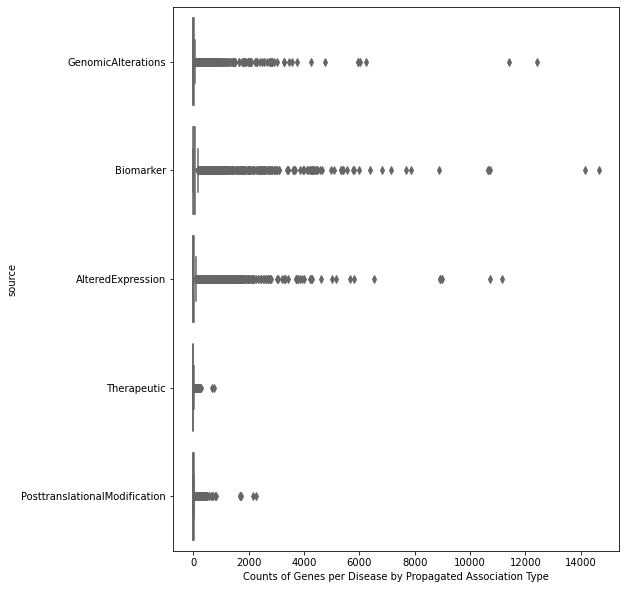

In [47]:
fig, ax = plt.subplots(figsize = (8,10))
sns.boxplot(y = 'source', x = 'Counts of Genes per Disease by Propagated Association Type',
                 data = SumDisease, palette="Set3", orient = 'h')

<AxesSubplot:xlabel='Log of Counts of Genes per Disease by Propagated Association Type', ylabel='source'>

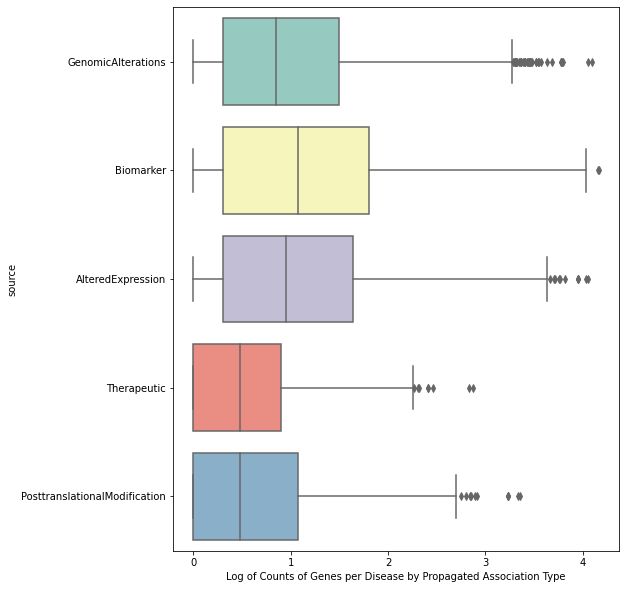

In [48]:
fig, ax = plt.subplots(figsize = (8,10))
sns.boxplot(y = 'source', x = 'Log of Counts of Genes per Disease by Propagated Association Type',
                 data = SumDisease, palette="Set3", orient = 'h')

Text(0, 0.5, 'Frequency')

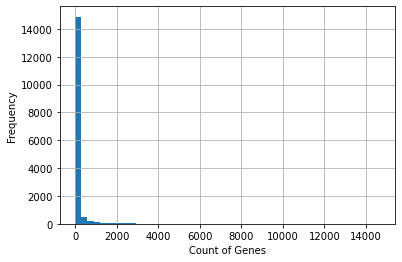

In [49]:
SumDisease['Counts of Genes per Disease by Propagated Association Type'].hist(bins=50)
plt.xlabel("Count of Genes", fontsize=10)
plt.ylabel("Frequency",fontsize=10)

Text(0, 0.5, 'Frequency')

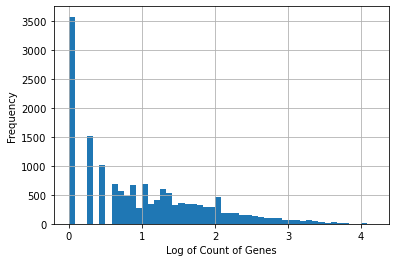

In [50]:
SumDisease['Log of Counts of Genes per Disease by Propagated Association Type'].hist(bins=50)
plt.xlabel("Log of Count of Genes", fontsize=10)
plt.ylabel("Frequency",fontsize=10)

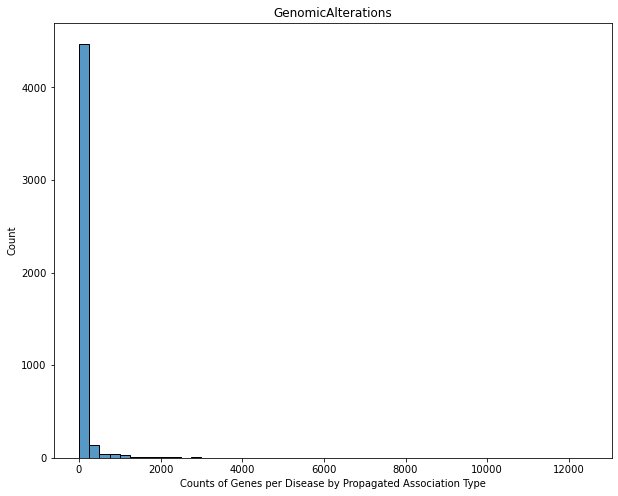

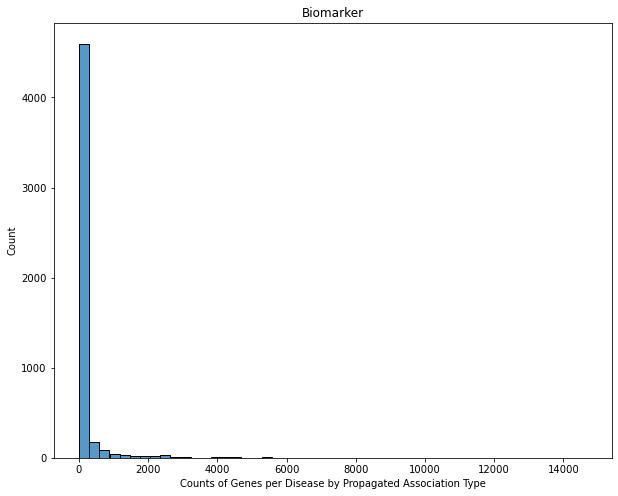

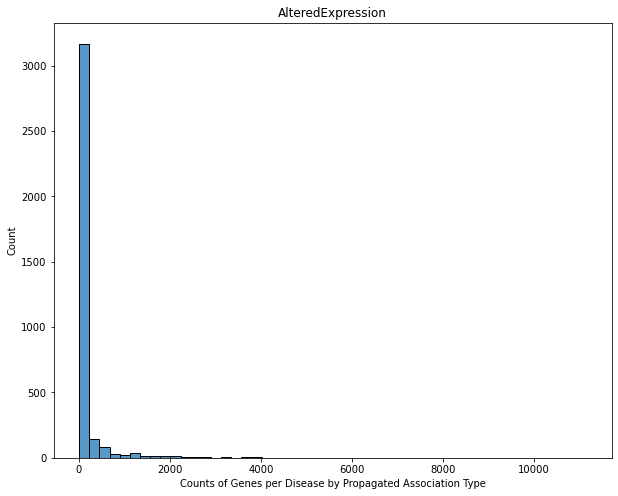

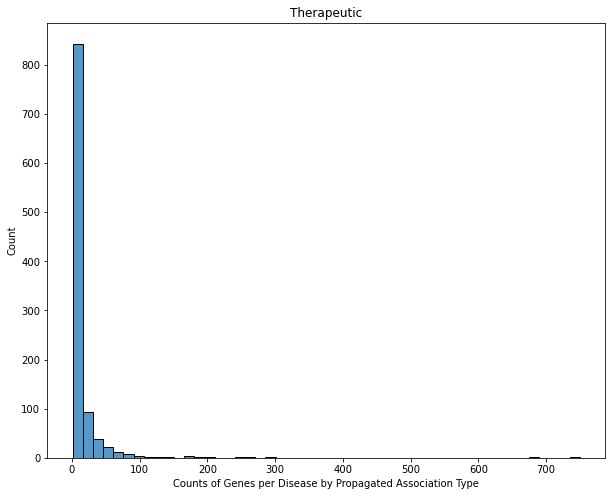

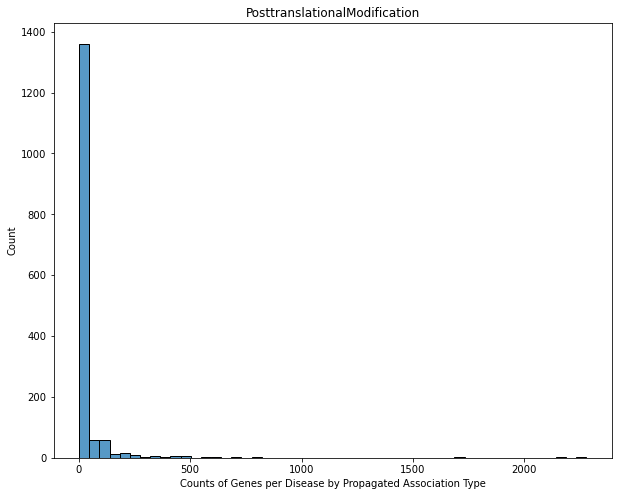

In [51]:
for i, source in enumerate(SumDisease.source.unique(), 1):
    data = SumDisease[SumDisease.source == source]
    fig, ax = plt.subplots(figsize = (10,8))
    sns.histplot(data['Counts of Genes per Disease by Propagated Association Type'], bins=50)
    plt.title(source)

## Find out all the disease terms that have ≥n_s genes (after propagation) from 3 different association types. Use n_s = 10 to begin with:

In [52]:
propagated

,DOID,geneSet,source,diseaseName
0,DOID:0002116,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77...",AlteredExpression,pterygium
1,DOID:10124,"{1537, 4609, 5122, 2, 4613, 6149, 5640, 3593, ...",AlteredExpression,corneal disease
2,DOID:1492,"{2, 4106, 13, 4112, 12304, 18, 20507, 4126, 32...",AlteredExpression,eye and adnexa disease
3,DOID:0050155,"{2, 4106, 13, 4112, 12304, 18, 20507, 4126, 41...",AlteredExpression,sensory system disease
4,DOID:7,"{1, 2, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 16, ...",AlteredExpression,disease of anatomical entity
...,...,...,...,...
1029,DOID:9538,"{1066, 2501, 1063}",Therapeutic,multiple myeloma
1030,DOID:9673,{7854},Therapeutic,ulcerative stomatitis
1031,DOID:9675,{5141},Therapeutic,pulmonary emphysema
1032,DOID:9854,{13623},Therapeutic,lingual-facial-buccal dyskinesia


In [53]:
propagatedafter = propagated.groupby(by = ['DOID', 'diseaseName'])['source'].apply(lambda x: set(x))
propagatedafter = propagatedafter.reset_index()

propagatedafter2 = propagatedafter[propagatedafter['source'].map(lambda d: len(d)) >= 3]
propagatedafter2

,DOID,diseaseName,source
0,DOID:0001816,angiosarcoma,"{Biomarker, GenomicAlterations, AlteredExpress..."
1,DOID:0002116,pterygium,"{Therapeutic, AlteredExpression, Posttranslati..."
2,DOID:0014667,disease of metabolism,"{Therapeutic, AlteredExpression, Posttranslati..."
3,DOID:0040084,Streptococcus pneumonia,"{Biomarker, GenomicAlterations, AlteredExpress..."
4,DOID:0040086,Polyomavirus-associated Nephropathy,"{Biomarker, GenomicAlterations, AlteredExpress..."
...,...,...,...
5290,DOID:9977,hallucinogen dependence,"{Biomarker, GenomicAlterations, Posttranslatio..."
5291,DOID:998,eosinophilia-myalgia syndrome,"{Biomarker, GenomicAlterations, AlteredExpress..."
5293,DOID:9988,tertiary neurosyphilis,"{Biomarker, GenomicAlterations, AlteredExpress..."
5294,DOID:999,hypereosinophilic syndrome,"{Biomarker, GenomicAlterations, Therapeutic, A..."


In [54]:
propagatedafter3 = pd.DataFrame([(c, tup.DOID, tup.diseaseName) for tup in propagatedafter2.itertuples() for c in tup.source])
propagatedafter3 = propagatedafter3.rename(columns= {0: 'source', 1: 'DOID', 2: 'diseaseName'})
propagatedafter3

,source,DOID,diseaseName
0,Biomarker,DOID:0001816,angiosarcoma
1,GenomicAlterations,DOID:0001816,angiosarcoma
2,AlteredExpression,DOID:0001816,angiosarcoma
3,Therapeutic,DOID:0002116,pterygium
4,AlteredExpression,DOID:0002116,pterygium
...,...,...,...
12724,AlteredExpression,DOID:999,hypereosinophilic syndrome
12725,Biomarker,DOID:9993,hypoglycemia
12726,GenomicAlterations,DOID:9993,hypoglycemia
12727,PosttranslationalModification,DOID:9993,hypoglycemia


In [55]:
propagatedafter4 = propagatedafter3.merge(propagated)
propagatedafter4

,source,DOID,diseaseName,geneSet
0,Biomarker,DOID:0001816,angiosarcoma,"{2808, 8534, 3799, 2390, 5241}"
1,GenomicAlterations,DOID:0001816,angiosarcoma,"{3840, 778, 4138, 26130, 2390, 6423, 2808, 524..."
2,AlteredExpression,DOID:0001816,angiosarcoma,"{1553, 5139, 4151, 25069, 3215}"
3,Therapeutic,DOID:0002116,pterygium,{2501}
4,AlteredExpression,DOID:0002116,pterygium,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77..."
...,...,...,...,...
12724,AlteredExpression,DOID:999,hypereosinophilic syndrome,"{837, 4999, 5832, 1735, 1037, 2575, 4368, 6481..."
12725,Biomarker,DOID:9993,hypoglycemia,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 308..."
12726,GenomicAlterations,DOID:9993,hypoglycemia,"{5122, 5379, 3078, 4358, 5382, 2312, 5385, 411..."
12727,PosttranslationalModification,DOID:9993,hypoglycemia,{4032}


In [ ]:
#DELETED CELL HERE

In [57]:
tempdict = {}
for index, row, in propagatedafter4.iterrows():
    if (row['DOID'] in tempdict):
        tempvaldict = tempdict.get(row['DOID'])
        tempvaldf = row['geneSet']
        tempvalmerge = tempvaldf.union(tempvaldict)
        tempdict.update({row['DOID']: tempvalmerge})
    else:
        tempdict.update({row['DOID']: row['geneSet']})
tempdict

{'DOID:0001816': {778,
  1553,
  2390,
  2808,
  3215,
  3799,
  3840,
  4138,
  4151,
  5139,
  5241,
  6423,
  8534,
  13399,
  25069,
  26130},
 'DOID:0002116': {50,
  151,
  161,
  211,
  247,
  400,
  434,
  437,
  621,
  704,
  750,
  776,
  778,
  817,
  837,
  864,
  893,
  938,
  943,
  945,
  946,
  1005,
  1034,
  1059,
  1108,
  1110,
  1111,
  1115,
  1146,
  1169,
  1214,
  1220,
  1276,
  1317,
  1361,
  1430,
  1436,
  1473,
  1509,
  1527,
  1530,
  1531,
  1532,
  1622,
  1624,
  1658,
  1672,
  1723,
  1735,
  1742,
  1743,
  1776,
  1814,
  1817,
  1821,
  1927,
  1928,
  2126,
  2127,
  2132,
  2247,
  2465,
  2466,
  2501,
  2530,
  2531,
  2535,
  2572,
  2574,
  2581,
  2585,
  2590,
  2649,
  2657,
  2680,
  2707,
  2708,
  2709,
  2764,
  2813,
  2821,
  2826,
  2873,
  2920,
  2921,
  2929,
  2979,
  3025,
  3033,
  3059,
  3123,
  3138,
  3139,
  3140,
  3142,
  3143,
  3144,
  3148,
  3183,
  3215,
  3270,
  3285,
  3322,
  3326,
  3415,
  3525,
  3551,
  3

In [58]:
df = pd.DataFrame([k for k in tempdict.items()], columns=['DOID', 'geneSet'])
df

,DOID,geneSet
0,DOID:0001816,"{3840, 778, 3215, 1553, 26130, 5139, 2390, 379..."
1,DOID:0002116,"{4613, 6149, 1034, 4106, 2572, 2574, 26130, 25..."
2,DOID:0014667,"{1, 2, 16385, 4, 5, 6, 7, 16390, 16394, 11, 12..."
3,DOID:0040084,"{14595, 3845, 1034, 2570, 1037, 782, 5134, 528..."
4,DOID:0040086,"{2176, 2630, 4934, 2282, 144, 4178, 724, 1461,..."
...,...,...
3397,DOID:9977,"{16897, 13830, 519, 1543, 2058, 2571, 1037, 13..."
3398,DOID:998,"{1153, 2274, 15172, 1735, 1160, 942, 2516, 514..."
3399,DOID:9988,"{8769, 1797, 5193, 5835, 268, 1292, 4568, 8669..."
3400,DOID:999,"{2304, 14595, 7684, 2570, 2571, 2572, 1037, 25..."


In [59]:
templist = []
for index, row, in df.iterrows():
    templist.append(len(row['geneSet']))
df['numgenes_prop'] = templist
df

,DOID,geneSet,numgenes_prop
0,DOID:0001816,"{3840, 778, 3215, 1553, 26130, 5139, 2390, 379...",16
1,DOID:0002116,"{4613, 6149, 1034, 4106, 2572, 2574, 26130, 25...",216
2,DOID:0014667,"{1, 2, 16385, 4, 5, 6, 7, 16390, 16394, 11, 12...",5944
3,DOID:0040084,"{14595, 3845, 1034, 2570, 1037, 782, 5134, 528...",100
4,DOID:0040086,"{2176, 2630, 4934, 2282, 144, 4178, 724, 1461,...",12
...,...,...,...
3397,DOID:9977,"{16897, 13830, 519, 1543, 2058, 2571, 1037, 13...",157
3398,DOID:998,"{1153, 2274, 15172, 1735, 1160, 942, 2516, 514...",10
3399,DOID:9988,"{8769, 1797, 5193, 5835, 268, 1292, 4568, 8669...",15
3400,DOID:999,"{2304, 14595, 7684, 2570, 2571, 2572, 1037, 25...",105


In [60]:
propagatedafter5 = df.copy()

In [61]:
propagatedafter5 = propagatedafter5.reset_index()
propagatedafter5 = propagatedafter5[propagatedafter5['numgenes_prop'].map(lambda d: d) >= 10]
propagatedafter5

,index,DOID,geneSet,numgenes_prop
0,0,DOID:0001816,"{3840, 778, 3215, 1553, 26130, 5139, 2390, 379...",16
1,1,DOID:0002116,"{4613, 6149, 1034, 4106, 2572, 2574, 26130, 25...",216
2,2,DOID:0014667,"{1, 2, 16385, 4, 5, 6, 7, 16390, 16394, 11, 12...",5944
3,3,DOID:0040084,"{14595, 3845, 1034, 2570, 1037, 782, 5134, 528...",100
4,4,DOID:0040086,"{2176, 2630, 4934, 2282, 144, 4178, 724, 1461,...",12
...,...,...,...,...
3397,3397,DOID:9977,"{16897, 13830, 519, 1543, 2058, 2571, 1037, 13...",157
3398,3398,DOID:998,"{1153, 2274, 15172, 1735, 1160, 942, 2516, 514...",10
3399,3399,DOID:9988,"{8769, 1797, 5193, 5835, 268, 1292, 4568, 8669...",15
3400,3400,DOID:999,"{2304, 14595, 7684, 2570, 2571, 2572, 1037, 25...",105


## Find out all the disease terms that have ≥n_d direct gene annotations (i.e., without propagation). Use n_d = 5 to begin with:

In [62]:
desired12

,DOID,diseaseName,propagatedAssociationType,geneNID
6,DOID:0002116,Pterygium,AlteredExpression,"{4613, 6149, 4106, 26130, 5653, 5141, 2585, 18..."
7,DOID:0002116,Pterygium,Biomarker,"{4613, 1034, 2581, 5141, 5653, 3613, 2590, 720..."
8,DOID:0002116,Pterygium,GenomicAlterations,"{10503, 2572, 2574, 3854, 5141, 1817, 3866, 45..."
9,DOID:0002116,Pterygium,PosttranslationalModification,"{1317, 778, 750, 26130, 5241}"
10,DOID:0002116,Pterygium,Therapeutic,{2501}
...,...,...,...,...
32934,DOID:9993,Hypoglycemia,Biomarker,"{2048, 2056, 2066, 6163, 27, 28, 12316, 30, 32..."
32935,DOID:9993,Hypoglycemia,GenomicAlterations,"{5122, 3078, 4111, 4627, 6684, 28, 31, 4138, 2..."
32936,DOID:9993,Hypoglycemia,PosttranslationalModification,{4032}
32937,DOID:9997,Peripartum cardiomyopathy,Biomarker,{4936}


In [64]:
tempdict = {}
for index, row, in desired12.iterrows():
    if (row['DOID'] in tempdict):
        tempvaldict = tempdict.get(row['DOID'])
        tempvaldf = row['geneNID']
        tempvalmerge = tempvaldf.union(tempvaldict)
        tempdict.update({row['DOID']: tempvalmerge})
    else:
        tempdict.update({row['DOID']: row['geneNID']})
tempdict

{'DOID:0002116': {50,
  151,
  161,
  211,
  247,
  400,
  434,
  437,
  621,
  704,
  750,
  776,
  778,
  817,
  837,
  864,
  893,
  938,
  943,
  945,
  946,
  1005,
  1034,
  1059,
  1108,
  1110,
  1111,
  1115,
  1146,
  1169,
  1214,
  1220,
  1276,
  1317,
  1361,
  1430,
  1436,
  1473,
  1509,
  1527,
  1530,
  1531,
  1532,
  1622,
  1624,
  1658,
  1672,
  1723,
  1735,
  1742,
  1743,
  1776,
  1814,
  1817,
  1821,
  1927,
  1928,
  2126,
  2127,
  2132,
  2247,
  2465,
  2466,
  2501,
  2530,
  2531,
  2535,
  2572,
  2574,
  2581,
  2585,
  2590,
  2649,
  2657,
  2680,
  2707,
  2708,
  2709,
  2764,
  2813,
  2821,
  2826,
  2873,
  2920,
  2921,
  2929,
  2979,
  3025,
  3033,
  3059,
  3123,
  3138,
  3139,
  3140,
  3142,
  3143,
  3144,
  3148,
  3183,
  3215,
  3270,
  3285,
  3322,
  3326,
  3415,
  3525,
  3551,
  3613,
  3657,
  3669,
  3694,
  3713,
  3799,
  3800,
  3802,
  3803,
  3833,
  3842,
  3849,
  3854,
  3863,
  3866,
  3926,
  4027,
  4106,
  4138

In [65]:
df = pd.DataFrame([k for k in tempdict.items()], columns=['DOID', 'geneId'])
df

,DOID,geneId
0,DOID:0002116,"{1527, 4613, 6149, 1034, 4106, 2572, 2574, 261..."
1,DOID:0014667,"{18432, 18433, 2052, 18436, 16390, 6, 2058, 20..."
2,DOID:0040084,"{14595, 3845, 2570, 1034, 1037, 782, 5134, 528..."
3,DOID:0040086,"{2176, 2630, 4934, 2282, 144, 4178, 724, 1461,..."
4,DOID:0040091,"{2433, 2946, 6916, 775, 7687, 13576, 3212, 666..."
...,...,...
4850,DOID:9986,"{737, 3893}"
4851,DOID:9988,"{8769, 19393, 18501, 2630, 5193, 5194, 2575, 2..."
4852,DOID:999,"{8193, 9224, 1034, 1037, 2066, 19, 20, 5141, 6..."
4853,DOID:9993,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 205..."


In [66]:
templist = []
for index, row, in df.iterrows():
    templist.append(len(row['geneId']))
df['numgenes_dir'] = templist
df

,DOID,geneId,numgenes_dir
0,DOID:0002116,"{1527, 4613, 6149, 1034, 4106, 2572, 2574, 261...",216
1,DOID:0014667,"{18432, 18433, 2052, 18436, 16390, 6, 2058, 20...",945
2,DOID:0040084,"{14595, 3845, 2570, 1034, 1037, 782, 5134, 528...",100
3,DOID:0040086,"{2176, 2630, 4934, 2282, 144, 4178, 724, 1461,...",12
4,DOID:0040091,"{2433, 2946, 6916, 775, 7687, 13576, 3212, 666...",49
...,...,...,...
4850,DOID:9986,"{737, 3893}",2
4851,DOID:9988,"{8769, 19393, 18501, 2630, 5193, 5194, 2575, 2...",21
4852,DOID:999,"{8193, 9224, 1034, 1037, 2066, 19, 20, 5141, 6...",328
4853,DOID:9993,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 205...",420


In [67]:
desired12before = df.copy()

In [68]:
desired12before = desired12before.reset_index()
desired12before = desired12before[desired12before['numgenes_dir'].map(lambda d: d) >= 5]
desired12before

,index,DOID,geneId,numgenes_dir
0,0,DOID:0002116,"{1527, 4613, 6149, 1034, 4106, 2572, 2574, 261...",216
1,1,DOID:0014667,"{18432, 18433, 2052, 18436, 16390, 6, 2058, 20...",945
2,2,DOID:0040084,"{14595, 3845, 2570, 1034, 1037, 782, 5134, 528...",100
3,3,DOID:0040086,"{2176, 2630, 4934, 2282, 144, 4178, 724, 1461,...",12
4,4,DOID:0040091,"{2433, 2946, 6916, 775, 7687, 13576, 3212, 666...",49
...,...,...,...,...
4848,4848,DOID:9976,"{770, 1282, 1029, 6, 1030, 1031, 12, 2061, 271...",100
4849,4849,DOID:998,"{1153, 2274, 15172, 1735, 1160, 942, 2516, 514...",10
4851,4851,DOID:9988,"{8769, 19393, 18501, 2630, 5193, 5194, 2575, 2...",21
4852,4852,DOID:999,"{8193, 9224, 1034, 1037, 2066, 19, 20, 5141, 6...",328


### Merging Process:

In [69]:
propagatedafter5 = propagatedafter5.drop(columns = 'index')
propagatedafter5

,DOID,geneSet,numgenes_prop
0,DOID:0001816,"{3840, 778, 3215, 1553, 26130, 5139, 2390, 379...",16
1,DOID:0002116,"{4613, 6149, 1034, 4106, 2572, 2574, 26130, 25...",216
2,DOID:0014667,"{1, 2, 16385, 4, 5, 6, 7, 16390, 16394, 11, 12...",5944
3,DOID:0040084,"{14595, 3845, 1034, 2570, 1037, 782, 5134, 528...",100
4,DOID:0040086,"{2176, 2630, 4934, 2282, 144, 4178, 724, 1461,...",12
...,...,...,...
3397,DOID:9977,"{16897, 13830, 519, 1543, 2058, 2571, 1037, 13...",157
3398,DOID:998,"{1153, 2274, 15172, 1735, 1160, 942, 2516, 514...",10
3399,DOID:9988,"{8769, 1797, 5193, 5835, 268, 1292, 4568, 8669...",15
3400,DOID:999,"{2304, 14595, 7684, 2570, 2571, 2572, 1037, 25...",105


In [70]:
desired12before = desired12before.drop(columns = 'index')
desired12before

,DOID,geneId,numgenes_dir
0,DOID:0002116,"{1527, 4613, 6149, 1034, 4106, 2572, 2574, 261...",216
1,DOID:0014667,"{18432, 18433, 2052, 18436, 16390, 6, 2058, 20...",945
2,DOID:0040084,"{14595, 3845, 2570, 1034, 1037, 782, 5134, 528...",100
3,DOID:0040086,"{2176, 2630, 4934, 2282, 144, 4178, 724, 1461,...",12
4,DOID:0040091,"{2433, 2946, 6916, 775, 7687, 13576, 3212, 666...",49
...,...,...,...
4848,DOID:9976,"{770, 1282, 1029, 6, 1030, 1031, 12, 2061, 271...",100
4849,DOID:998,"{1153, 2274, 15172, 1735, 1160, 942, 2516, 514...",10
4851,DOID:9988,"{8769, 19393, 18501, 2630, 5193, 5194, 2575, 2...",21
4852,DOID:999,"{8193, 9224, 1034, 1037, 2066, 19, 20, 5141, 6...",328


In [71]:
mergedNew = propagatedafter5.merge(desired12before, how = 'inner')
mergedNew = mergedNew.drop(columns = ['geneSet', 'geneId'])
mergedNew

,DOID,numgenes_prop,numgenes_dir
0,DOID:0002116,216,216
1,DOID:0014667,5944,945
2,DOID:0040084,100,100
3,DOID:0040086,12,12
4,DOID:0040091,49,49
...,...,...,...
2561,DOID:9976,100,100
2562,DOID:998,10,10
2563,DOID:9988,15,21
2564,DOID:999,105,328


In [73]:
test = mergedNew.merge(propagated)
test

,DOID,numgenes_prop,numgenes_dir,geneSet,source,diseaseName
0,DOID:0002116,216,216,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77...",AlteredExpression,pterygium
1,DOID:0002116,216,216,"{4613, 1034, 2581, 5141, 5653, 3613, 2590, 720...",Biomarker,pterygium
2,DOID:0002116,216,216,"{10503, 2572, 2574, 3854, 5141, 1817, 3866, 45...",GenomicAlterations,pterygium
3,DOID:0002116,216,216,"{26130, 1317, 5241, 778, 750}",PosttranslationalModification,pterygium
4,DOID:0002116,216,216,{2501},Therapeutic,pterygium
...,...,...,...,...,...,...
9780,DOID:999,105,328,"{1872, 4256}",Therapeutic,hypereosinophilic syndrome
9781,DOID:9993,420,420,"{1793, 1028, 2056, 2312, 2058, 1036, 7184, 232...",AlteredExpression,hypoglycemia
9782,DOID:9993,420,420,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 308...",Biomarker,hypoglycemia
9783,DOID:9993,420,420,"{5122, 5379, 3078, 4358, 5382, 2312, 5385, 411...",GenomicAlterations,hypoglycemia


In [74]:
mergedNew2 = test.rename(columns = {'DOID': 'dis_doid', 'diseaseName': 'dis_name'})
mergedNew2 = mergedNew2[['dis_doid', 'dis_name', 'source', 'numgenes_prop', 'numgenes_dir', 'geneSet']]
mergedNew2

,dis_doid,dis_name,source,numgenes_prop,numgenes_dir,geneSet
0,DOID:0002116,pterygium,AlteredExpression,216,216,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77..."
1,DOID:0002116,pterygium,Biomarker,216,216,"{4613, 1034, 2581, 5141, 5653, 3613, 2590, 720..."
2,DOID:0002116,pterygium,GenomicAlterations,216,216,"{10503, 2572, 2574, 3854, 5141, 1817, 3866, 45..."
3,DOID:0002116,pterygium,PosttranslationalModification,216,216,"{26130, 1317, 5241, 778, 750}"
4,DOID:0002116,pterygium,Therapeutic,216,216,{2501}
...,...,...,...,...,...,...
9780,DOID:999,hypereosinophilic syndrome,Therapeutic,105,328,"{1872, 4256}"
9781,DOID:9993,hypoglycemia,AlteredExpression,420,420,"{1793, 1028, 2056, 2312, 2058, 1036, 7184, 232..."
9782,DOID:9993,hypoglycemia,Biomarker,420,420,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 308..."
9783,DOID:9993,hypoglycemia,GenomicAlterations,420,420,"{5122, 5379, 3078, 4358, 5382, 2312, 5385, 411..."


In [75]:
mergedNew2['numgenes_AlteredExpression'] = np.NaN
mergedNew2['numgenes_Biomarker'] = np.NaN
mergedNew2['numgenes_GenomicAlterations'] = np.NaN
mergedNew2['numgenes_PosttranslationalModification'] = np.NaN
mergedNew2['numgenes_Therapeutic'] = np.NaN
mergedNew2

,dis_doid,dis_name,source,numgenes_prop,numgenes_dir,geneSet,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic
0,DOID:0002116,pterygium,AlteredExpression,216,216,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77...",NaN,NaN,NaN,NaN,NaN
1,DOID:0002116,pterygium,Biomarker,216,216,"{4613, 1034, 2581, 5141, 5653, 3613, 2590, 720...",NaN,NaN,NaN,NaN,NaN
2,DOID:0002116,pterygium,GenomicAlterations,216,216,"{10503, 2572, 2574, 3854, 5141, 1817, 3866, 45...",NaN,NaN,NaN,NaN,NaN
3,DOID:0002116,pterygium,PosttranslationalModification,216,216,"{26130, 1317, 5241, 778, 750}",NaN,NaN,NaN,NaN,NaN
4,DOID:0002116,pterygium,Therapeutic,216,216,{2501},NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
9780,DOID:999,hypereosinophilic syndrome,Therapeutic,105,328,"{1872, 4256}",NaN,NaN,NaN,NaN,NaN
9781,DOID:9993,hypoglycemia,AlteredExpression,420,420,"{1793, 1028, 2056, 2312, 2058, 1036, 7184, 232...",NaN,NaN,NaN,NaN,NaN
9782,DOID:9993,hypoglycemia,Biomarker,420,420,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 308...",NaN,NaN,NaN,NaN,NaN
9783,DOID:9993,hypoglycemia,GenomicAlterations,420,420,"{5122, 5379, 3078, 4358, 5382, 2312, 5385, 411...",NaN,NaN,NaN,NaN,NaN


In [76]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'AlteredExpression'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_AlteredExpression'] = templist
mergedNew2

,dis_doid,dis_name,source,numgenes_prop,numgenes_dir,geneSet,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic
0,DOID:0002116,pterygium,AlteredExpression,216,216,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77...",92,NaN,NaN,NaN,NaN
1,DOID:0002116,pterygium,Biomarker,216,216,"{4613, 1034, 2581, 5141, 5653, 3613, 2590, 720...",0,NaN,NaN,NaN,NaN
2,DOID:0002116,pterygium,GenomicAlterations,216,216,"{10503, 2572, 2574, 3854, 5141, 1817, 3866, 45...",0,NaN,NaN,NaN,NaN
3,DOID:0002116,pterygium,PosttranslationalModification,216,216,"{26130, 1317, 5241, 778, 750}",0,NaN,NaN,NaN,NaN
4,DOID:0002116,pterygium,Therapeutic,216,216,{2501},0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
9780,DOID:999,hypereosinophilic syndrome,Therapeutic,105,328,"{1872, 4256}",0,NaN,NaN,NaN,NaN
9781,DOID:9993,hypoglycemia,AlteredExpression,420,420,"{1793, 1028, 2056, 2312, 2058, 1036, 7184, 232...",92,NaN,NaN,NaN,NaN
9782,DOID:9993,hypoglycemia,Biomarker,420,420,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 308...",0,NaN,NaN,NaN,NaN
9783,DOID:9993,hypoglycemia,GenomicAlterations,420,420,"{5122, 5379, 3078, 4358, 5382, 2312, 5385, 411...",0,NaN,NaN,NaN,NaN


In [77]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'Biomarker'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_Biomarker'] = templist

In [78]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'GenomicAlterations'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_GenomicAlterations'] = templist

In [79]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'PosttranslationalModification'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_PosttranslationalModification'] = templist

In [80]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'Therapeutic'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_Therapeutic'] = templist

In [81]:
mergedNew2

,dis_doid,dis_name,source,numgenes_prop,numgenes_dir,geneSet,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic
0,DOID:0002116,pterygium,AlteredExpression,216,216,"{3842, 8451, 4613, 6149, 10503, 3849, 4106, 77...",92,0,0,0,0
1,DOID:0002116,pterygium,Biomarker,216,216,"{4613, 1034, 2581, 5141, 5653, 3613, 2590, 720...",0,129,0,0,0
2,DOID:0002116,pterygium,GenomicAlterations,216,216,"{10503, 2572, 2574, 3854, 5141, 1817, 3866, 45...",0,0,32,0,0
3,DOID:0002116,pterygium,PosttranslationalModification,216,216,"{26130, 1317, 5241, 778, 750}",0,0,0,5,0
4,DOID:0002116,pterygium,Therapeutic,216,216,{2501},0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
9780,DOID:999,hypereosinophilic syndrome,Therapeutic,105,328,"{1872, 4256}",0,0,0,0,2
9781,DOID:9993,hypoglycemia,AlteredExpression,420,420,"{1793, 1028, 2056, 2312, 2058, 1036, 7184, 232...",92,0,0,0,0
9782,DOID:9993,hypoglycemia,Biomarker,420,420,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 308...",0,318,0,0,0
9783,DOID:9993,hypoglycemia,GenomicAlterations,420,420,"{5122, 5379, 3078, 4358, 5382, 2312, 5385, 411...",0,0,108,0,0


In [82]:
ArjunData = mergedNew2[['dis_doid', 'dis_name','numgenes_AlteredExpression', 'numgenes_Biomarker', 'numgenes_GenomicAlterations',
       'numgenes_PosttranslationalModification', 'numgenes_Therapeutic', 'numgenes_dir', 'numgenes_prop']]
ArjunData

,dis_doid,dis_name,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic,numgenes_dir,numgenes_prop
0,DOID:0002116,pterygium,92,0,0,0,0,216,216
1,DOID:0002116,pterygium,0,129,0,0,0,216,216
2,DOID:0002116,pterygium,0,0,32,0,0,216,216
3,DOID:0002116,pterygium,0,0,0,5,0,216,216
4,DOID:0002116,pterygium,0,0,0,0,1,216,216
...,...,...,...,...,...,...,...,...,...
9780,DOID:999,hypereosinophilic syndrome,0,0,0,0,2,328,105
9781,DOID:9993,hypoglycemia,92,0,0,0,0,420,420
9782,DOID:9993,hypoglycemia,0,318,0,0,0,420,420
9783,DOID:9993,hypoglycemia,0,0,108,0,0,420,420


In [83]:
ArjunData2 = ArjunData.groupby(['dis_doid', 'dis_name', 'numgenes_dir', 'numgenes_prop']).sum()
ArjunData2

,,,,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic
dis_doid,dis_name,numgenes_dir,numgenes_prop,,,,,
DOID:0002116,pterygium,216,216,92,129,32,5,1
DOID:0014667,disease of metabolism,945,5944,2711,4445,2789,209,128
DOID:0040084,Streptococcus pneumonia,100,100,20,72,14,0,0
DOID:0040086,Polyomavirus-associated Nephropathy,12,12,3,7,2,0,0
DOID:0040091,autoimmune pancreatitis,49,49,3,37,14,1,0
...,...,...,...,...,...,...,...,...
DOID:9976,heroin dependence,100,100,13,37,71,0,0
DOID:998,eosinophilia-myalgia syndrome,10,10,3,7,1,0,0
DOID:9988,tertiary neurosyphilis,21,15,6,5,8,0,0


In [84]:
ArjunData2 = ArjunData2.reset_index()
ArjunData2

,dis_doid,dis_name,numgenes_dir,numgenes_prop,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic
0,DOID:0002116,pterygium,216,216,92,129,32,5,1
1,DOID:0014667,disease of metabolism,945,5944,2711,4445,2789,209,128
2,DOID:0040084,Streptococcus pneumonia,100,100,20,72,14,0,0
3,DOID:0040086,Polyomavirus-associated Nephropathy,12,12,3,7,2,0,0
4,DOID:0040091,autoimmune pancreatitis,49,49,3,37,14,1,0
...,...,...,...,...,...,...,...,...,...
2561,DOID:9976,heroin dependence,100,100,13,37,71,0,0
2562,DOID:998,eosinophilia-myalgia syndrome,10,10,3,7,1,0,0
2563,DOID:9988,tertiary neurosyphilis,21,15,6,5,8,0,0
2564,DOID:999,hypereosinophilic syndrome,328,105,35,66,23,0,2


In [85]:
ArjunData2 = ArjunData2.sort_values(by = 'numgenes_prop', ascending = False)
ArjunData2

,dis_doid,dis_name,numgenes_dir,numgenes_prop,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic
2387,DOID:863,nervous system disease,977,11042,5174,8872,6231,636,258
2305,DOID:77,gastrointestinal system disease,150,10208,5673,7864,4239,780,176
1708,DOID:331,central nervous system disease,319,9248,4294,7148,4777,494,204
2066,DOID:5295,intestinal disease,209,7627,3862,5549,2855,454,60
1390,DOID:17,musculoskeletal system disease,38,7593,3751,5763,3281,257,54
...,...,...,...,...,...,...,...,...,...
219,DOID:0060652,familial erythrocytosis 1,31,10,1,2,8,0,0
1478,DOID:2211,factor XIII deficiency,10,10,1,7,3,1,0
1266,DOID:13884,sick sinus syndrome,52,10,9,1,1,0,1
1481,DOID:2217,Bernard-Soulier syndrome,46,10,8,3,3,0,0


In [87]:
ArjunData2 = ArjunData2[['dis_doid', 'dis_name','numgenes_AlteredExpression', 'numgenes_Biomarker', 'numgenes_GenomicAlterations',
       'numgenes_PosttranslationalModification', 'numgenes_Therapeutic', 'numgenes_dir', 'numgenes_prop']]

In [88]:
templist = []
for index, row, in ArjunData2.iterrows():
    tempcount = 0
    if (row['numgenes_AlteredExpression'] >= 10):
        tempcount += 1
    if (row['numgenes_Biomarker'] >= 10):
        tempcount += 1
    if (row['numgenes_GenomicAlterations'] >= 10):
        tempcount += 1
    if (row['numgenes_PosttranslationalModification'] >= 10):
        tempcount += 1
    if (row['numgenes_Therapeutic'] >= 10):
        tempcount += 1
    else:
        tempcount += 0
    templist.append(tempcount)
ArjunData2['tempcounts'] = templist

<ipython-input-88-ddb268f7a221>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ArjunData2['tempcounts'] = templist


In [89]:
ArjunData3 = ArjunData2[ArjunData2['tempcounts'].map(lambda d: d) >= 3]
ArjunData3

,dis_doid,dis_name,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic,numgenes_dir,numgenes_prop,tempcounts
2387,DOID:863,nervous system disease,5174,8872,6231,636,258,977,11042,5
2305,DOID:77,gastrointestinal system disease,5673,7864,4239,780,176,150,10208,5
1708,DOID:331,central nervous system disease,4294,7148,4777,494,204,319,9248,5
2066,DOID:5295,intestinal disease,3862,5549,2855,454,60,209,7627,5
1390,DOID:17,musculoskeletal system disease,3751,5763,3281,257,54,38,7593,5
...,...,...,...,...,...,...,...,...,...,...
1336,DOID:14695,galactokinase deficiency,10,19,10,0,0,32,29,3
2549,DOID:9870,galactosemia,10,19,10,0,0,29,29,3
1730,DOID:3369,Ewing sarcoma,11,10,11,1,0,649,28,3
1151,DOID:12801,mucopolysaccharidosis III,11,18,11,0,0,39,25,3


In [90]:
ArjunData3 = ArjunData3.drop(columns = 'tempcounts')
ArjunData3

,dis_doid,dis_name,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic,numgenes_dir,numgenes_prop
2387,DOID:863,nervous system disease,5174,8872,6231,636,258,977,11042
2305,DOID:77,gastrointestinal system disease,5673,7864,4239,780,176,150,10208
1708,DOID:331,central nervous system disease,4294,7148,4777,494,204,319,9248
2066,DOID:5295,intestinal disease,3862,5549,2855,454,60,209,7627
1390,DOID:17,musculoskeletal system disease,3751,5763,3281,257,54,38,7593
...,...,...,...,...,...,...,...,...,...
1336,DOID:14695,galactokinase deficiency,10,19,10,0,0,32,29
2549,DOID:9870,galactosemia,10,19,10,0,0,29,29
1730,DOID:3369,Ewing sarcoma,11,10,11,1,0,649,28
1151,DOID:12801,mucopolysaccharidosis III,11,18,11,0,0,39,25


In [91]:
ArjunData3.to_csv('DesiredDataArjunAssociations.tsv', index = False, sep = "\t")

In [92]:
df = pd.read_csv('DesiredDataArjunAssociations.tsv', sep = '\t')
df

,dis_doid,dis_name,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic,numgenes_dir,numgenes_prop
0,DOID:863,nervous system disease,5174,8872,6231,636,258,977,11042
1,DOID:77,gastrointestinal system disease,5673,7864,4239,780,176,150,10208
2,DOID:331,central nervous system disease,4294,7148,4777,494,204,319,9248
3,DOID:5295,intestinal disease,3862,5549,2855,454,60,209,7627
4,DOID:17,musculoskeletal system disease,3751,5763,3281,257,54,38,7593
...,...,...,...,...,...,...,...,...,...
1199,DOID:14695,galactokinase deficiency,10,19,10,0,0,32,29
1200,DOID:9870,galactosemia,10,19,10,0,0,29,29
1201,DOID:3369,Ewing sarcoma,11,10,11,1,0,649,28
1202,DOID:12801,mucopolysaccharidosis III,11,18,11,0,0,39,25


## Steps (WITH FILTERS):
1. Imported Original Propagated Disease Gene Dataset
2. Recategorized to only have our five association types (all biomarker data, not unique)
3. Imported Disease Mappings and Disease Attributes Files to get diseases in DOID format (only keeping those diseases labeled as DO in vocabulary)
4. Used Ontology to only keep diseases belonging to descendants of our 14 higher-level terms, or those terms themselves
5. Wrote code to write to GMT files (if we want to use this disease data in the machine learning model
6. Created Boxplots and Histograms (total, log, and by association type) like earlier to understand dataset and size of gene sets
7. Find out all the disease terms that have 10+ TOTAL genes (after propagation) from 3 different association types
8. Find out all the disease terms that have 5+ TOTAL direct gene annotations (without propagation)
9. Intersected Datasets from above 2 Filters
10. Intersected this dataset with the propagated DISEASE dataset to get back the genesets (of propagation, like was requested prior), association type, and disease name
11. Found counts of genes by association type and reorganized the dataset to look the way Arjun wanted it
12. Filtered out diseases that did not have at least 10 genes after propagation from EACH SOURCE for at least three sources

## Making the All Data File:

In [94]:
resultDOIDshort = resultDOID.drop(columns = 'diseaseName')
dict_of_sources = dict(iter(resultDOIDshort.groupby('propagatedAssociationType')))

In [95]:
AE_dict = dict(zip(dict_of_sources['AlteredExpression'].DOID, dict_of_sources['AlteredExpression'].geneNID))
BM_human_dict = dict(zip(dict_of_sources['Biomarker'].DOID, dict_of_sources['Biomarker'].geneNID))
GA_dict = dict(zip(dict_of_sources['GenomicAlterations'].DOID, dict_of_sources['GenomicAlterations'].geneNID))
PTM_dict = dict(zip(dict_of_sources['PosttranslationalModification'].DOID, dict_of_sources['PosttranslationalModification'].geneNID))
T_dict = dict(zip(dict_of_sources['Therapeutic'].DOID, dict_of_sources['Therapeutic'].geneNID))

In [96]:
AE_prop = disease_ontology.propagate(AE_dict)
BM_prop = disease_ontology.propagate(BM_human_dict)
GA_prop = disease_ontology.propagate(GA_dict)
PTM_prop = disease_ontology.propagate(PTM_dict)
T_prop = disease_ontology.propagate(T_dict)

In [97]:
AE = pd.DataFrame([k for k in AE_prop.items()], columns=['DOID', 'geneSet'])
BM = pd.DataFrame([k for k in BM_prop.items()], columns=['DOID', 'geneSet'])
GA = pd.DataFrame([k for k in GA_prop.items()], columns=['DOID', 'geneSet'])
PTM = pd.DataFrame([k for k in PTM_prop.items()], columns=['DOID', 'geneSet'])
T = pd.DataFrame([k for k in T_prop.items()], columns=['DOID', 'geneSet'])

In [98]:
AE['source'] = 'AlteredExpression'
BM['source'] = 'Biomarker'
GA['source'] = 'GenomicAlterations'
PTM['source'] = 'PosttranslationalModification'
T['source'] = 'Therapeutic'

In [ ]:
propagated = AE.append(BM).append(GA).append(PTM).append(T)
propagated

In [100]:
templist = []
for index, row, in propagated.iterrows():
    if (row['DOID'] in disease_ontology.nodes):
        templist.append(disease_ontology.nodes[row['DOID']]["name"])
    else:
        templist.append("error")
propagated['diseaseName'] = templist
propagated

,DOID,geneSet,source,diseaseName
0,DOID:0001816,"{778, 3084, 780, 1553, 5139, 10260, 1567, 5158...",AlteredExpression,angiosarcoma
1,DOID:162,"{1, 2, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15, 16, 1...",AlteredExpression,cancer
2,DOID:14566,"{1, 2, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15, 16, 1...",AlteredExpression,disease of cellular proliferation
3,DOID:1115,"{7, 8201, 8218, 38, 16425, 50, 54, 55, 8248, 1...",AlteredExpression,sarcoma
4,DOID:0050687,"{1, 2, 4, 5, 6, 7, 8, 13, 14, 15, 18, 19, 20, ...",AlteredExpression,cell type cancer
...,...,...,...,...
1140,DOID:9673,{7854},Therapeutic,ulcerative stomatitis
1141,DOID:9675,{5141},Therapeutic,pulmonary emphysema
1142,DOID:9778,{6000},Therapeutic,irritable bowel syndrome
1143,DOID:9854,{13623},Therapeutic,lingual-facial-buccal dyskinesia


### FINDING NUMGENES_PROP

In [ ]:
#DELETED CELL HERE

In [102]:
tempdict = {}
for index, row, in propagated.iterrows():
    if (row['DOID'] in tempdict):
        tempvaldict = tempdict.get(row['DOID'])
        tempvaldf = row['geneSet']
        tempvalmerge = tempvaldf.union(tempvaldict)
        tempdict.update({row['DOID']: tempvalmerge})
    else:
        tempdict.update({row['DOID']: row['geneSet']})
tempdict

{'DOID:0001816': {111,
  112,
  151,
  174,
  202,
  213,
  223,
  229,
  433,
  497,
  498,
  700,
  704,
  771,
  778,
  780,
  835,
  974,
  993,
  1005,
  1035,
  1066,
  1108,
  1110,
  1115,
  1200,
  1212,
  1385,
  1401,
  1424,
  1487,
  1493,
  1517,
  1523,
  1535,
  1553,
  1567,
  1716,
  1717,
  1723,
  1726,
  1776,
  1935,
  2242,
  2247,
  2390,
  2391,
  2428,
  2464,
  2630,
  2707,
  2764,
  2785,
  2808,
  2974,
  3059,
  3084,
  3090,
  3118,
  3138,
  3215,
  3285,
  3465,
  3469,
  3471,
  3499,
  3615,
  3701,
  3713,
  3799,
  3800,
  3802,
  3803,
  3840,
  3930,
  4017,
  4027,
  4042,
  4059,
  4138,
  4151,
  4177,
  4254,
  4323,
  4395,
  4400,
  4465,
  4515,
  4524,
  4529,
  4586,
  4639,
  4703,
  4710,
  4716,
  4784,
  4844,
  4993,
  5106,
  5114,
  5119,
  5132,
  5139,
  5158,
  5174,
  5219,
  5241,
  5342,
  5343,
  5434,
  5436,
  5438,
  5455,
  5470,
  5486,
  5497,
  5778,
  6156,
  6423,
  6593,
  6704,
  6970,
  7357,
  7369,
  7455,
  7

In [103]:
df = pd.DataFrame([k for k in tempdict.items()], columns=['DOID', 'geneSet'])
df

,DOID,geneSet
0,DOID:0001816,"{26117, 11784, 1035, 5132, 6156, 3084, 1553, 2..."
1,DOID:162,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1..."
2,DOID:14566,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1..."
3,DOID:1115,"{7, 8201, 11, 13, 19, 21, 8218, 38, 8231, 1642..."
4,DOID:0050687,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1..."
...,...,...
7030,DOID:10290,"{1334, 3558}"
7031,DOID:2533,{1066}
7032,DOID:4406,"{778, 26130, 750}"
7033,DOID:4860,"{778, 26130}"


In [104]:
templist = []
for index, row, in df.iterrows():
    templist.append(len(row['geneSet']))
df['numgenes_prop'] = templist
df

,DOID,geneSet,numgenes_prop
0,DOID:0001816,"{26117, 11784, 1035, 5132, 6156, 3084, 1553, 2...",169
1,DOID:162,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1...",14408
2,DOID:14566,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1...",14501
3,DOID:1115,"{7, 8201, 11, 13, 19, 21, 8218, 38, 8231, 1642...",2748
4,DOID:0050687,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1...",12435
...,...,...,...
7030,DOID:10290,"{1334, 3558}",2
7031,DOID:2533,{1066},1
7032,DOID:4406,"{778, 26130, 750}",3
7033,DOID:4860,"{778, 26130}",2


In [106]:
propagatedafter5 = df.copy()
propagatedafter5

,DOID,geneSet,numgenes_prop
0,DOID:0001816,"{26117, 11784, 1035, 5132, 6156, 3084, 1553, 2...",169
1,DOID:162,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1...",14408
2,DOID:14566,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1...",14501
3,DOID:1115,"{7, 8201, 11, 13, 19, 21, 8218, 38, 8231, 1642...",2748
4,DOID:0050687,"{1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 1...",12435
...,...,...,...
7030,DOID:10290,"{1334, 3558}",2
7031,DOID:2533,{1066},1
7032,DOID:4406,"{778, 26130, 750}",3
7033,DOID:4860,"{778, 26130}",2


### FINDING NUMGENES_DIR

In [107]:
tempdict = {}
for index, row, in resultDOID.iterrows():
    if (row['DOID'] in tempdict):
        tempvaldict = tempdict.get(row['DOID'])
        tempvaldf = row['geneNID']
        tempvalmerge = tempvaldf.union(tempvaldict)
        tempdict.update({row['DOID']: tempvalmerge})
    else:
        tempdict.update({row['DOID']: row['geneNID']})
tempdict

{'DOID:0001816': {111,
  112,
  151,
  174,
  213,
  223,
  229,
  433,
  497,
  498,
  700,
  704,
  771,
  778,
  780,
  835,
  974,
  993,
  1005,
  1035,
  1066,
  1108,
  1110,
  1115,
  1200,
  1212,
  1385,
  1401,
  1424,
  1487,
  1493,
  1517,
  1523,
  1535,
  1553,
  1567,
  1716,
  1717,
  1723,
  1726,
  1776,
  1935,
  2242,
  2247,
  2390,
  2391,
  2428,
  2438,
  2464,
  2630,
  2707,
  2764,
  2785,
  2808,
  2974,
  3059,
  3084,
  3090,
  3118,
  3138,
  3285,
  3465,
  3469,
  3471,
  3499,
  3615,
  3701,
  3713,
  3799,
  3800,
  3802,
  3803,
  3840,
  3930,
  4017,
  4027,
  4042,
  4059,
  4138,
  4177,
  4254,
  4323,
  4395,
  4400,
  4465,
  4515,
  4524,
  4529,
  4586,
  4639,
  4703,
  4710,
  4716,
  4784,
  4844,
  4993,
  5106,
  5114,
  5119,
  5132,
  5158,
  5174,
  5219,
  5241,
  5342,
  5343,
  5434,
  5436,
  5438,
  5455,
  5470,
  5486,
  5497,
  5778,
  6156,
  6593,
  6704,
  6970,
  7357,
  7369,
  7455,
  7472,
  7618,
  7858,
  8008,
  

In [108]:
df = pd.DataFrame([k for k in tempdict.items()], columns=['DOID', 'geneId'])
df

,DOID,geneId
0,DOID:0001816,"{26117, 11784, 1035, 5132, 6156, 3084, 1553, 3..."
1,DOID:0002116,"{1527, 4613, 6149, 1034, 4106, 2572, 2574, 261..."
2,DOID:0014667,"{18432, 18433, 2052, 18436, 16390, 6, 2058, 20..."
3,DOID:0040084,"{14595, 3845, 2570, 1034, 1037, 782, 5134, 528..."
4,DOID:0040085,"{2, 8205, 17, 22, 8220, 4127, 32, 8227, 36, 41..."
...,...,...
6634,DOID:9986,"{737, 3893}"
6635,DOID:9988,"{8769, 19393, 18501, 2630, 5193, 5194, 2575, 2..."
6636,DOID:999,"{8193, 9224, 1034, 1037, 2066, 19, 20, 5141, 6..."
6637,DOID:9993,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 205..."


In [109]:
templist = []
for index, row, in df.iterrows():
    templist.append(len(row['geneId']))
df['numgenes_dir'] = templist
df

,DOID,geneId,numgenes_dir
0,DOID:0001816,"{26117, 11784, 1035, 5132, 6156, 3084, 1553, 3...",163
1,DOID:0002116,"{1527, 4613, 6149, 1034, 4106, 2572, 2574, 261...",216
2,DOID:0014667,"{18432, 18433, 2052, 18436, 16390, 6, 2058, 20...",945
3,DOID:0040084,"{14595, 3845, 2570, 1034, 1037, 782, 5134, 528...",100
4,DOID:0040085,"{2, 8205, 17, 22, 8220, 4127, 32, 8227, 36, 41...",1453
...,...,...,...
6634,DOID:9986,"{737, 3893}",2
6635,DOID:9988,"{8769, 19393, 18501, 2630, 5193, 5194, 2575, 2...",21
6636,DOID:999,"{8193, 9224, 1034, 1037, 2066, 19, 20, 5141, 6...",328
6637,DOID:9993,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 205...",420


In [110]:
desired12before = df.copy()
desired12before

,DOID,geneId,numgenes_dir
0,DOID:0001816,"{26117, 11784, 1035, 5132, 6156, 3084, 1553, 3...",163
1,DOID:0002116,"{1527, 4613, 6149, 1034, 4106, 2572, 2574, 261...",216
2,DOID:0014667,"{18432, 18433, 2052, 18436, 16390, 6, 2058, 20...",945
3,DOID:0040084,"{14595, 3845, 2570, 1034, 1037, 782, 5134, 528...",100
4,DOID:0040085,"{2, 8205, 17, 22, 8220, 4127, 32, 8227, 36, 41...",1453
...,...,...,...
6634,DOID:9986,"{737, 3893}",2
6635,DOID:9988,"{8769, 19393, 18501, 2630, 5193, 5194, 2575, 2...",21
6636,DOID:999,"{8193, 9224, 1034, 1037, 2066, 19, 20, 5141, 6...",328
6637,DOID:9993,"{2048, 5122, 1027, 1028, 3078, 2056, 1032, 205...",420


### Intersecting Datasets to have one with number of genes propagated and direct

In [113]:
mergedNew = propagatedafter5.merge(desired12before, how = 'inner')
mergedNew = mergedNew.drop(columns = ['geneSet', 'geneId'])
mergedNew

,DOID,numgenes_prop,numgenes_dir
0,DOID:0001816,169,163
1,DOID:162,14408,11480
2,DOID:1115,2748,706
3,DOID:0002116,216,216
4,DOID:10124,971,47
...,...,...,...
6634,DOID:10290,2,2
6635,DOID:2533,1,1
6636,DOID:4406,3,3
6637,DOID:4860,2,2


In [115]:
#We need to drop numgenes_prop that got added in by mistake from my naming conventions
propagated2 = propagated.drop(columns = 'numgenes_prop')
propagated2

,DOID,geneSet,source,diseaseName
0,DOID:0001816,"{778, 3084, 780, 1553, 5139, 10260, 1567, 5158...",AlteredExpression,angiosarcoma
1,DOID:162,"{1, 2, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15, 16, 1...",AlteredExpression,cancer
2,DOID:14566,"{1, 2, 4, 5, 6, 7, 8, 9, 12, 13, 14, 15, 16, 1...",AlteredExpression,disease of cellular proliferation
3,DOID:1115,"{7, 8201, 8218, 38, 16425, 50, 54, 55, 8248, 1...",AlteredExpression,sarcoma
4,DOID:0050687,"{1, 2, 4, 5, 6, 7, 8, 13, 14, 15, 18, 19, 20, ...",AlteredExpression,cell type cancer
...,...,...,...,...
1140,DOID:9673,{7854},Therapeutic,ulcerative stomatitis
1141,DOID:9675,{5141},Therapeutic,pulmonary emphysema
1142,DOID:9778,{6000},Therapeutic,irritable bowel syndrome
1143,DOID:9854,{13623},Therapeutic,lingual-facial-buccal dyskinesia


In [116]:
test = mergedNew.merge(propagated2)
test

,DOID,numgenes_prop,numgenes_dir,geneSet,source,diseaseName
0,DOID:0001816,169,163,"{778, 3084, 780, 1553, 5139, 10260, 1567, 5158...",AlteredExpression,angiosarcoma
1,DOID:0001816,169,163,"{3840, 771, 11784, 778, 6156, 3090, 26130, 105...",Biomarker,angiosarcoma
2,DOID:0001816,169,163,"{3840, 26117, 778, 1035, 5132, 1935, 26130, 64...",GenomicAlterations,angiosarcoma
3,DOID:0001816,169,163,"{229, 5241, 13997}",PosttranslationalModification,angiosarcoma
4,DOID:0001816,169,163,{1066},Therapeutic,angiosarcoma
...,...,...,...,...,...,...
19160,DOID:10290,2,2,"{1334, 3558}",PosttranslationalModification,prostate lymphoma
19161,DOID:2533,1,1,{1066},PosttranslationalModification,splenic infarction
19162,DOID:4406,3,3,"{778, 26130, 750}",PosttranslationalModification,spongiotic dermatitis
19163,DOID:4860,2,2,"{778, 26130}",PosttranslationalModification,brain stem astrocytic neoplasm


In [117]:
mergedNew2 = test.rename(columns = {'DOID': 'dis_doid', 'diseaseName': 'dis_name'})
mergedNew2 = mergedNew2[['dis_doid', 'dis_name', 'source', 'numgenes_prop', 'numgenes_dir', 'geneSet']]
mergedNew2

,dis_doid,dis_name,source,numgenes_prop,numgenes_dir,geneSet
0,DOID:0001816,angiosarcoma,AlteredExpression,169,163,"{778, 3084, 780, 1553, 5139, 10260, 1567, 5158..."
1,DOID:0001816,angiosarcoma,Biomarker,169,163,"{3840, 771, 11784, 778, 6156, 3090, 26130, 105..."
2,DOID:0001816,angiosarcoma,GenomicAlterations,169,163,"{3840, 26117, 778, 1035, 5132, 1935, 26130, 64..."
3,DOID:0001816,angiosarcoma,PosttranslationalModification,169,163,"{229, 5241, 13997}"
4,DOID:0001816,angiosarcoma,Therapeutic,169,163,{1066}
...,...,...,...,...,...,...
19160,DOID:10290,prostate lymphoma,PosttranslationalModification,2,2,"{1334, 3558}"
19161,DOID:2533,splenic infarction,PosttranslationalModification,1,1,{1066}
19162,DOID:4406,spongiotic dermatitis,PosttranslationalModification,3,3,"{778, 26130, 750}"
19163,DOID:4860,brain stem astrocytic neoplasm,PosttranslationalModification,2,2,"{778, 26130}"


In [118]:
mergedNew2['numgenes_AlteredExpression'] = np.NaN
mergedNew2['numgenes_Biomarker'] = np.NaN
mergedNew2['numgenes_GenomicAlterations'] = np.NaN
mergedNew2['numgenes_PosttranslationalModification'] = np.NaN
mergedNew2['numgenes_Therapeutic'] = np.NaN
mergedNew2

,dis_doid,dis_name,source,numgenes_prop,numgenes_dir,geneSet,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic
0,DOID:0001816,angiosarcoma,AlteredExpression,169,163,"{778, 3084, 780, 1553, 5139, 10260, 1567, 5158...",NaN,NaN,NaN,NaN,NaN
1,DOID:0001816,angiosarcoma,Biomarker,169,163,"{3840, 771, 11784, 778, 6156, 3090, 26130, 105...",NaN,NaN,NaN,NaN,NaN
2,DOID:0001816,angiosarcoma,GenomicAlterations,169,163,"{3840, 26117, 778, 1035, 5132, 1935, 26130, 64...",NaN,NaN,NaN,NaN,NaN
3,DOID:0001816,angiosarcoma,PosttranslationalModification,169,163,"{229, 5241, 13997}",NaN,NaN,NaN,NaN,NaN
4,DOID:0001816,angiosarcoma,Therapeutic,169,163,{1066},NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
19160,DOID:10290,prostate lymphoma,PosttranslationalModification,2,2,"{1334, 3558}",NaN,NaN,NaN,NaN,NaN
19161,DOID:2533,splenic infarction,PosttranslationalModification,1,1,{1066},NaN,NaN,NaN,NaN,NaN
19162,DOID:4406,spongiotic dermatitis,PosttranslationalModification,3,3,"{778, 26130, 750}",NaN,NaN,NaN,NaN,NaN
19163,DOID:4860,brain stem astrocytic neoplasm,PosttranslationalModification,2,2,"{778, 26130}",NaN,NaN,NaN,NaN,NaN


In [119]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'AlteredExpression'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_AlteredExpression'] = templist

In [120]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'Biomarker'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_Biomarker'] = templist

In [121]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'GenomicAlterations'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_GenomicAlterations'] = templist

In [122]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'PosttranslationalModification'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_PosttranslationalModification'] = templist

In [123]:
templist = []
for index, row, in mergedNew2.iterrows():
    if (row['source'] == 'Therapeutic'):
        templist.append(len(row['geneSet']))
    else:
        templist.append(0)
mergedNew2['numgenes_Therapeutic'] = templist

In [124]:
mergedNew2

,dis_doid,dis_name,source,numgenes_prop,numgenes_dir,geneSet,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic
0,DOID:0001816,angiosarcoma,AlteredExpression,169,163,"{778, 3084, 780, 1553, 5139, 10260, 1567, 5158...",63,0,0,0,0
1,DOID:0001816,angiosarcoma,Biomarker,169,163,"{3840, 771, 11784, 778, 6156, 3090, 26130, 105...",0,94,0,0,0
2,DOID:0001816,angiosarcoma,GenomicAlterations,169,163,"{3840, 26117, 778, 1035, 5132, 1935, 26130, 64...",0,0,48,0,0
3,DOID:0001816,angiosarcoma,PosttranslationalModification,169,163,"{229, 5241, 13997}",0,0,0,3,0
4,DOID:0001816,angiosarcoma,Therapeutic,169,163,{1066},0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
19160,DOID:10290,prostate lymphoma,PosttranslationalModification,2,2,"{1334, 3558}",0,0,0,2,0
19161,DOID:2533,splenic infarction,PosttranslationalModification,1,1,{1066},0,0,0,1,0
19162,DOID:4406,spongiotic dermatitis,PosttranslationalModification,3,3,"{778, 26130, 750}",0,0,0,3,0
19163,DOID:4860,brain stem astrocytic neoplasm,PosttranslationalModification,2,2,"{778, 26130}",0,0,0,2,0


In [125]:
ArjunData = mergedNew2.groupby(['dis_doid', 'dis_name', 'numgenes_dir', 'numgenes_prop']).sum()
ArjunData = ArjunData.reset_index()
ArjunData = ArjunData.sort_values(by = 'numgenes_prop', ascending = False)
ArjunData = ArjunData[['dis_doid', 'dis_name','numgenes_AlteredExpression', 'numgenes_Biomarker', 'numgenes_GenomicAlterations',
       'numgenes_PosttranslationalModification', 'numgenes_Therapeutic', 'numgenes_dir', 'numgenes_prop']]
ArjunData

,dis_doid,dis_name,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic,numgenes_dir,numgenes_prop
4354,DOID:162,cancer,9908,12125,6890,1998,215,11480,14408
6303,DOID:863,nervous system disease,5174,8872,6231,636,258,977,11042
4842,DOID:305,carcinoma,6767,8033,3679,951,58,2544,10230
6150,DOID:77,gastrointestinal system disease,5673,7864,4239,780,176,150,10208
4820,DOID:2994,germ cell cancer,5386,7697,2888,637,26,308,9270
...,...,...,...,...,...,...,...,...,...
5663,DOID:5368,Wolffian duct adenocarcinoma,0,0,1,0,0,1,1
2510,DOID:0110675,congenital myasthenic syndrome 11,0,1,1,0,0,1,1
2511,DOID:0110676,congenital myasthenic syndrome 13,0,1,1,0,0,1,1
2515,DOID:0110680,congenital myasthenic syndrome 2C,0,1,0,0,0,1,1


In [126]:
ArjunData.to_csv('DesiredDataArjunAssociationAllDisease.tsv', index = False, sep = "\t")

In [127]:
ALL = pd.read_csv('DesiredDataArjunAssociationAllDisease.tsv', sep = "\t")
ALL

,dis_doid,dis_name,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic,numgenes_dir,numgenes_prop
0,DOID:162,cancer,9908,12125,6890,1998,215,11480,14408
1,DOID:863,nervous system disease,5174,8872,6231,636,258,977,11042
2,DOID:305,carcinoma,6767,8033,3679,951,58,2544,10230
3,DOID:77,gastrointestinal system disease,5673,7864,4239,780,176,150,10208
4,DOID:2994,germ cell cancer,5386,7697,2888,637,26,308,9270
...,...,...,...,...,...,...,...,...,...
6634,DOID:5368,Wolffian duct adenocarcinoma,0,0,1,0,0,1,1
6635,DOID:0110675,congenital myasthenic syndrome 11,0,1,1,0,0,1,1
6636,DOID:0110676,congenital myasthenic syndrome 13,0,1,1,0,0,1,1
6637,DOID:0110680,congenital myasthenic syndrome 2C,0,1,0,0,0,1,1


In [128]:
filtered = pd.read_csv('DesiredDataArjunAssociations.tsv', sep = '\t')
filtered

,dis_doid,dis_name,numgenes_AlteredExpression,numgenes_Biomarker,numgenes_GenomicAlterations,numgenes_PosttranslationalModification,numgenes_Therapeutic,numgenes_dir,numgenes_prop
0,DOID:863,nervous system disease,5174,8872,6231,636,258,977,11042
1,DOID:77,gastrointestinal system disease,5673,7864,4239,780,176,150,10208
2,DOID:331,central nervous system disease,4294,7148,4777,494,204,319,9248
3,DOID:5295,intestinal disease,3862,5549,2855,454,60,209,7627
4,DOID:17,musculoskeletal system disease,3751,5763,3281,257,54,38,7593
...,...,...,...,...,...,...,...,...,...
1199,DOID:14695,galactokinase deficiency,10,19,10,0,0,32,29
1200,DOID:9870,galactosemia,10,19,10,0,0,29,29
1201,DOID:3369,Ewing sarcoma,11,10,11,1,0,649,28
1202,DOID:12801,mucopolysaccharidosis III,11,18,11,0,0,39,25


## Steps (NO FILTERING):
1. Imported Original Propagated Disease Gene Dataset
2. Recategorized to only have our five association types (all biomarker data, not unique)
3. Imported Disease Mappings and Disease Attributes Files to get diseases in DOID format (only keeping those diseases labeled as DO in vocabulary)
4. Find out the number of genes before and after propagation for all diseases
5. Intersected this dataset with the propagated DISEASE dataset to get back the genesets (of propagation, like was requested prior), association type, and disease name
6. Found counts of genes by association type and reorganized the dataset to look the way Arjun wanted it